#**Traffic Prediction with weather and collisions Data**

##By : Abdullah Yasser, Abdelrahman Alsammany, Mohamed Goma & Mona Elsayed

#GitHub Repo : https://github.com/MohamedElsadany56/Traffic_Predictor.git

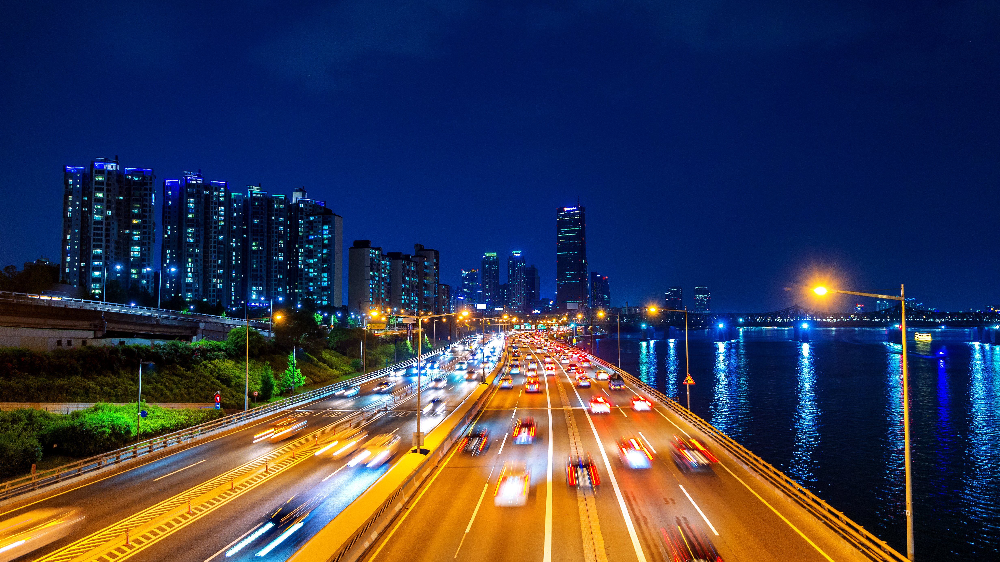

# Project Overview

#**Traffic Speed and Travel Time Prediction Using Weather and Collision Data**
##**Case Study: Belt Parkway Westbound – JFK Expressway, NYC**

## Objective

This project focuses on building machine learning models to predict two key traffic metrics — **vehicle speed** and **travel time** — for a major highway segment in New York City. The primary goal is to assess the effectiveness of various features, especially **lag-based and rolling window features**, in enhancing model accuracy. The models are trained and evaluated on data collected from multiple sources, covering traffic conditions, weather parameters, and collision events.

## Study Area

The selected prediction zone is a high-traffic section of **Belt Parkway Westbound**, between **W 182nd Street** and **JFK Expressway**, located near **John F. Kennedy International Airport (JFK)**. This area was chosen for its high activity, data richness, and critical role in connecting to major urban infrastructure.

## Data Sources

The project integrates data from the following sources:

* **NYC DOT Traffic Speeds**
  [https://data.cityofnewyork.us/Transportation/DOT-Traffic-Speeds-NBE/i4gi-tjb9](https://data.cityofnewyork.us/Transportation/DOT-Traffic-Speeds-NBE/i4gi-tjb9)
* **NYC Motor Vehicle Collision Reports**
  [https://data.cityofnewyork.us/Public-Safety/Motor-Vehicle-Collisions-Crashes/h9gi-nx95](https://data.cityofnewyork.us/Public-Safety/Motor-Vehicle-Collisions-Crashes/h9gi-nx95)
* **Visual Crossing Weather Data**
  [https://www.visualcrossing.com/](https://www.visualcrossing.com/)

Due to API rate limitations, weather data was manually downloaded and aggregated on a monthly basis.

## Methodology

The pipeline includes the following steps:

1. **Data Preprocessing:**

   * Filtering and aligning timestamps
   * Cleaning missing and inconsistent records
   * Splitting the dataset chronologically (70% training, 15% validation, 15% test)

2. **Feature Engineering:**

   * Cyclic encoding of time features (hour, day, month using sine/cosine)
   * Weather conditions (temperature, wind, humidity, etc.)
   * Collision severity, injuries, and fatality data
   * Lag features (1h, 2h, 3h, 24h, 168h) and rolling statistics (mean, std over 3h, 6h, 12h)
   * Percentage and absolute change from previous intervals

3. **Modeling Techniques:**
   The following regression models were applied:

   * CatBoost
   * XGBoost
   * LightGBM
   * Random Forest Regressor
   * Multi-layer Perceptron (Neural Network)

4. **Evaluation Metrics:**

   * Root Mean Squared Error (RMSE)
   * Mean Squared Error (MSE)
   * Mean Absolute Error (MAE)
   * Median Absolute Error (MedianAE)
   * Coefficient of Determination (R²)
   * Explained Variance Score
   * Model Inference Time (Response Time)

## Key Insights

* Incorporating lag and rolling window features significantly improved model performance, particularly for LightGBM and XGBoost.
* The best-performing model was **LightGBM with lag features**, achieving an RMSE of **1.08** for speed prediction.
* Models trained **without lag features** performed substantially worse, highlighting the importance of historical context in time-series traffic forecasting.

## Limitations

* Weather data was generalized to the city level (Queens), which may not reflect localized microclimate variations affecting specific road segments.
* The study focused on a single highway segment, which limits model generalizability to other roads or cities.
* Weather data collection was manual due to API constraints, which may introduce noise or inconsistencies.
* Computational resources were limited (Google Colab), restricting deeper hyperparameter optimization or more complex models like LSTM.

##Install requirements

In [ ]:
!pip install -q  tensorflow
!pip install -q  keras_tuner
!pip install -q  scikeras
!pip install -q  gdown
!pip install -q  catboost
!pip install -q  lightgbm
!pip install -q  xgboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 10.1 MB/s eta 0:00:00


Import Libraries

In [ ]:
import pandas as pd
import numpy as np
from sklearn.neighbors import BallTree
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import time
import math
import scipy.stats as stats
from catboost import CatBoostRegressor, Pool
from sklearn.preprocessing import MinMaxScaler ,LabelEncoder
from sklearn.ensemble import RandomForestRegressor
from sklearn.multioutput import MultiOutputRegressor
from sklearn.metrics import (
    mean_squared_error, mean_absolute_error, median_absolute_error,
    r2_score, explained_variance_score
)
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
import seaborn as sns


Get Traffic, weather and collisions data

In [ ]:
traffic = pd.read_csv('traffic.csv')
weather = pd.read_csv('weather.csv')
events = pd.read_csv('collisions.csv')

In [ ]:
# Set aesthetic Seaborn style
sns.set(style="whitegrid", palette="Set2", font_scale=1.1)
plt.rcParams['figure.figsize'] = (12, 6)

# Exploratory Data Analysis (EDA)

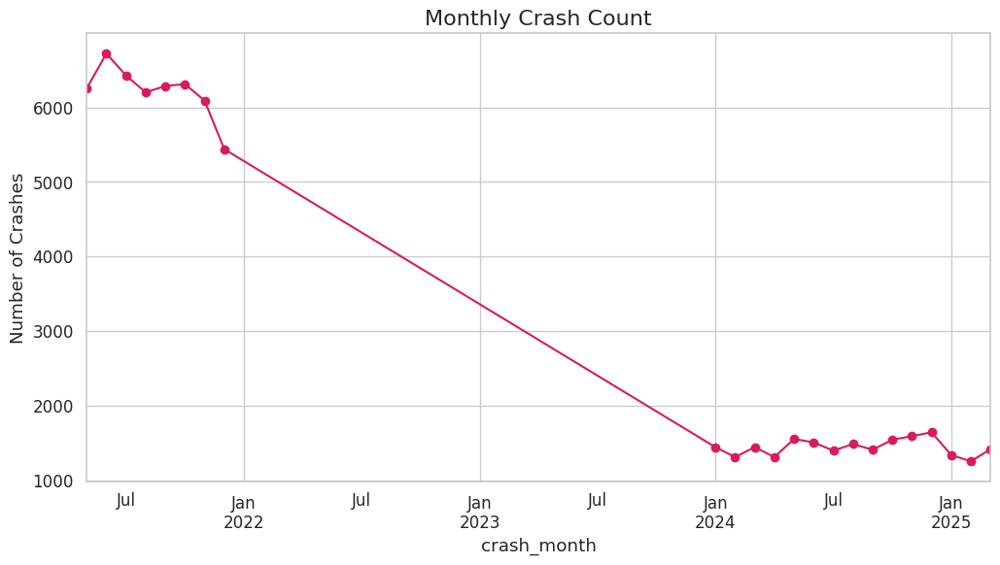

In [ ]:
collisions = pd.read_csv("collisions.csv", parse_dates=['CRASH DATE'])

# Monthly crash trend
collisions['crash_month'] = collisions['CRASH DATE'].dt.to_period('M')
monthly_crashes = collisions.groupby('crash_month').size()

monthly_crashes.plot(kind='line', color='#D81B60', marker='o')
plt.title('Monthly Crash Count', fontsize=16)
plt.ylabel('Number of Crashes')
plt.grid(True)
plt.show()




<ipython-input-7-55e1513a4622>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=collisions, x='BOROUGH', order=collisions['BOROUGH'].value_counts().index, palette="Spectral")


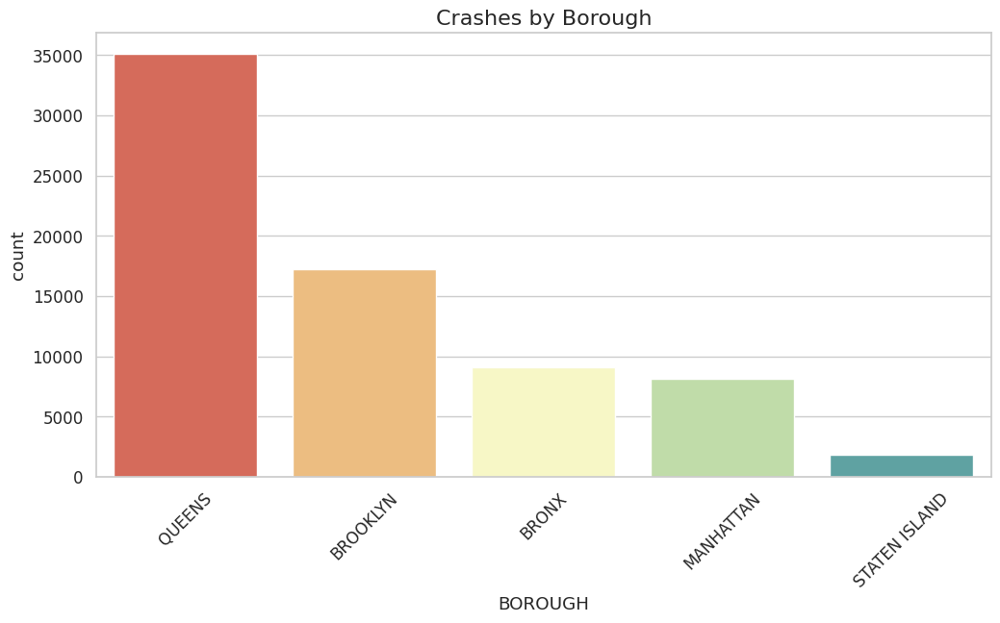

In [ ]:
# Crashes by borough
sns.countplot(data=collisions, x='BOROUGH', order=collisions['BOROUGH'].value_counts().index, palette="Spectral")
plt.title('Crashes by Borough', fontsize=16)
plt.xticks(rotation=45)
plt.show()

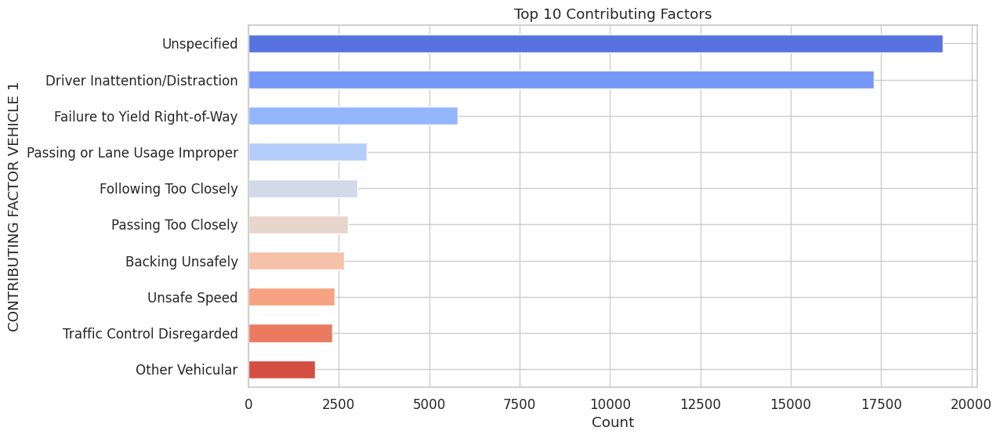

In [ ]:
# Top contributing factors
top_factors = collisions['CONTRIBUTING FACTOR VEHICLE 1'].value_counts().head(10)
top_factors.plot(kind='barh', color=sns.color_palette("coolwarm", 10))
plt.title('Top 10 Contributing Factors')
plt.xlabel("Count")
plt.gca().invert_yaxis()
plt.show()

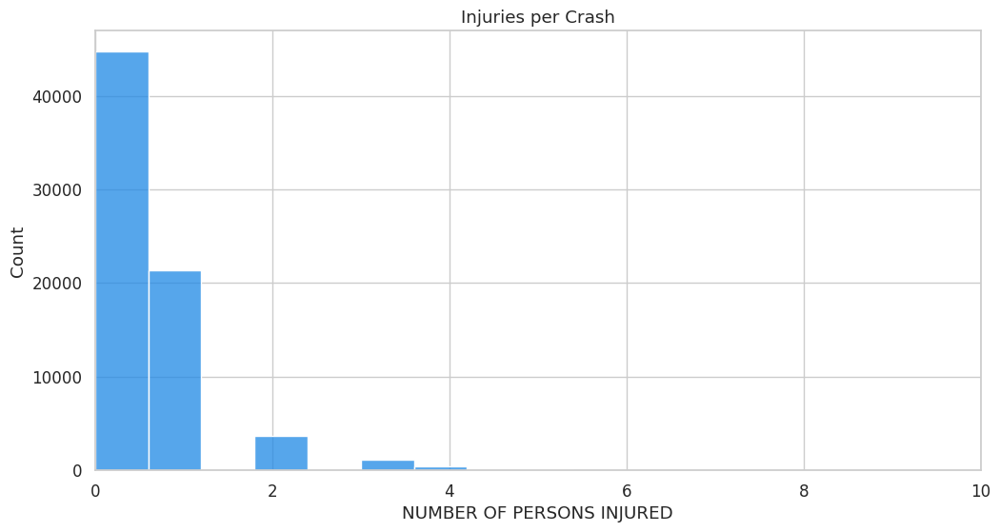

In [ ]:
# Injuries per crash
sns.histplot(collisions['NUMBER OF PERSONS INJURED'], bins=30, kde=False, color='#1E88E5')
plt.title("Injuries per Crash")
plt.xlim(0, 10)
plt.show()

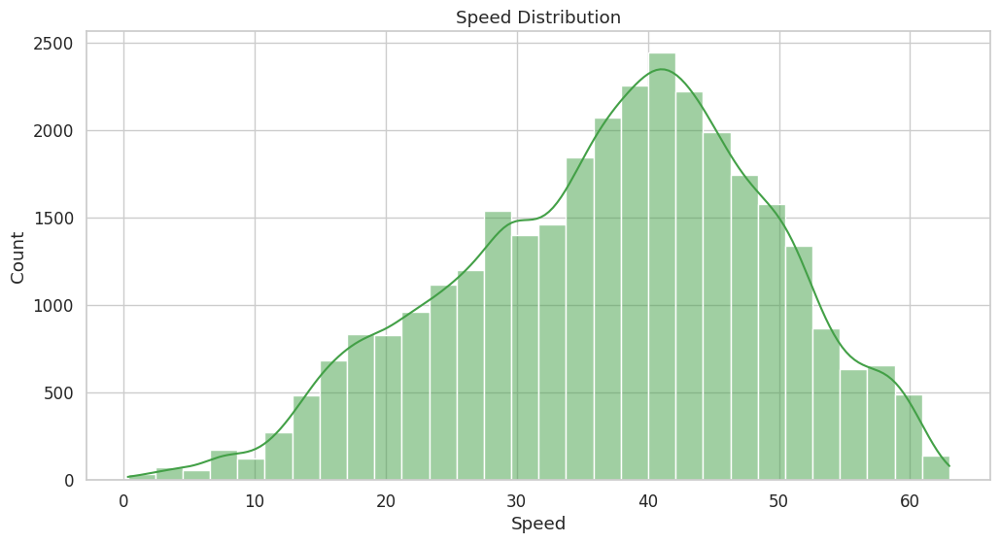

In [ ]:
traffic = pd.read_csv("traffic.csv", parse_dates=['data_as_of'])

# Speed histogram
sns.histplot(traffic['speed'], kde=True, bins=30, color='#43A047')
plt.title('Speed Distribution')
plt.xlabel('Speed')
plt.show()

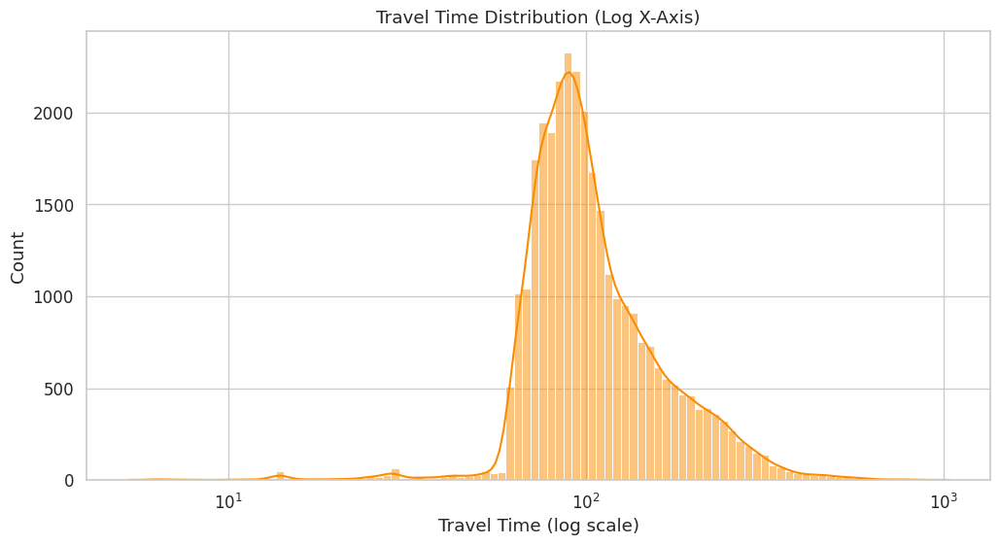

In [ ]:
sns.histplot(traffic['travel_time'], bins=100, kde=True, color='#FB8C00', log_scale=(True, False))
plt.title("Travel Time Distribution (Log X-Axis)")
plt.xlabel("Travel Time (log scale)")
plt.show()


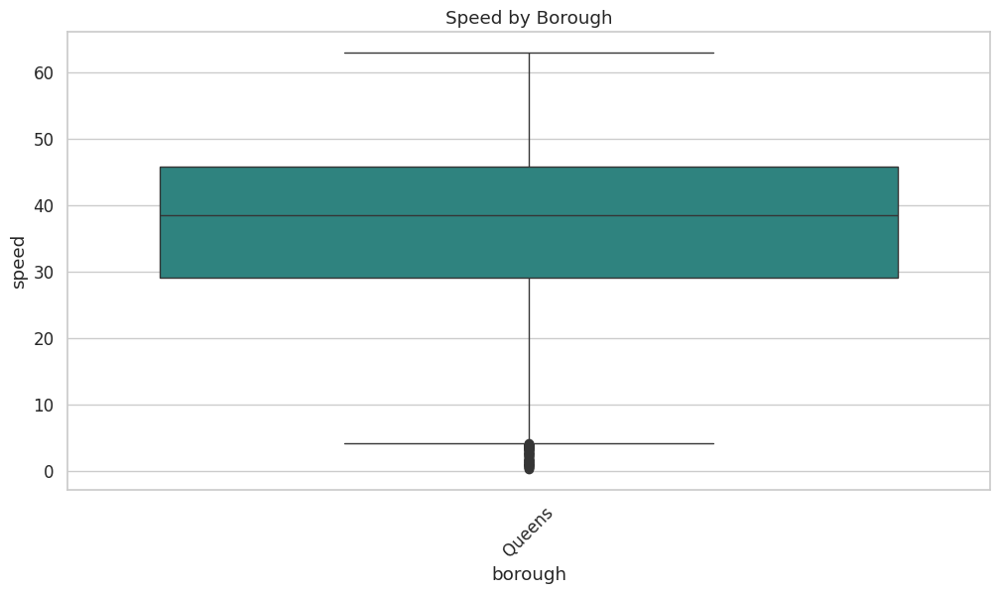

In [ ]:
# Speed by borough
sns.boxplot(data=traffic, x='borough', y='speed', palette='viridis',hue='borough',legend=False)
plt.title('Speed by Borough')
plt.xticks(rotation=45)
plt.show()

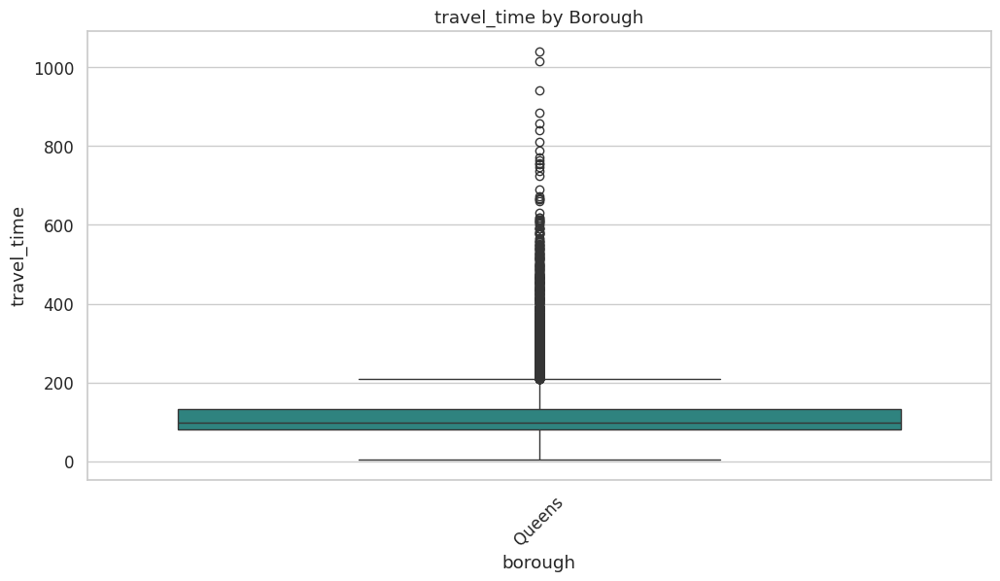

In [ ]:
# travel_time by borough
sns.boxplot(data=traffic, x='borough', y='travel_time', palette='viridis',hue='borough',legend=False)
plt.title('travel_time by Borough')
plt.xticks(rotation=45)
plt.show()

##Solving Outliers in speed and travel_time columns

In [ ]:
max_speed =traffic['speed'].max()
min_speed =traffic['speed'].min()
max_travel_time = traffic['travel_time'].max()
min_travel_time = traffic['travel_time'].min()

print(f"Maximum speed: {max_speed}")
print(f"Minimum speed: {min_speed}")
print(f"Maximum travel time: {max_travel_time}")
print(f"Minimum travel time: {min_travel_time}")


Maximum speed: 63.01
Minimum speed: 0.31
Maximum travel time: 1040.92
Minimum travel time: 5.25


In [ ]:
min_valid_speed = 0
max_valid_speed = 65
traffic.loc[traffic['speed'] > max_valid_speed, 'speed'] = max_valid_speed

In [ ]:
q1 = traffic['travel_time'].quantile(0.25)
q3 = traffic['travel_time'].quantile(0.75)
iqr = q3 - q1

upper_bound_moderate = q3 + 1.5 * iqr

upper_bound_extreme = q3 + 3 * iqr

print(f"Moderate outlier threshold (Q3 + 1.5*IQR): {upper_bound_moderate:.2f} minutes")
print(f"Extreme outlier threshold (Q3 + 3*IQR): {upper_bound_extreme:.2f} minutes")

traffic.loc[traffic['travel_time'] > upper_bound_extreme, 'travel_time'] = upper_bound_extreme

Moderate outlier threshold (Q3 + 1.5*IQR): 209.71 minutes
Extreme outlier threshold (Q3 + 3*IQR): 287.33 minutes


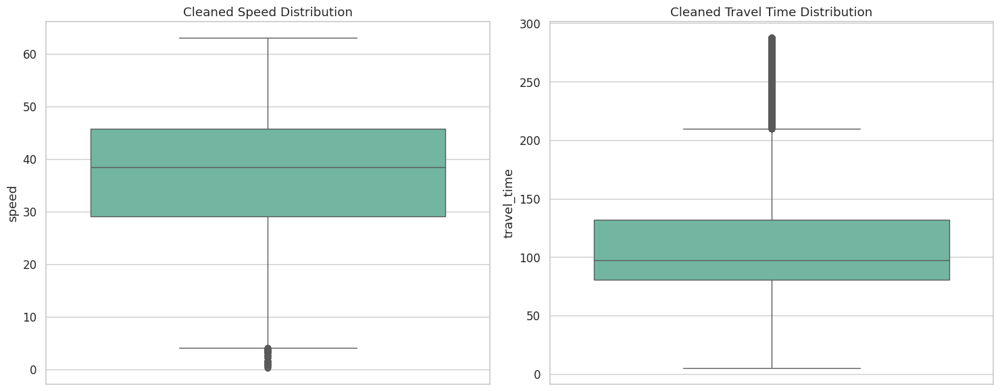

In [ ]:
plt.figure(figsize=(15, 6))

plt.subplot(1, 2, 1)
sns.boxplot(y=traffic['speed'])
plt.title('Cleaned Speed Distribution')

plt.subplot(1, 2, 2)
sns.boxplot(y=traffic['travel_time'])
plt.title('Cleaned Travel Time Distribution')
plt.tight_layout()
plt.show()

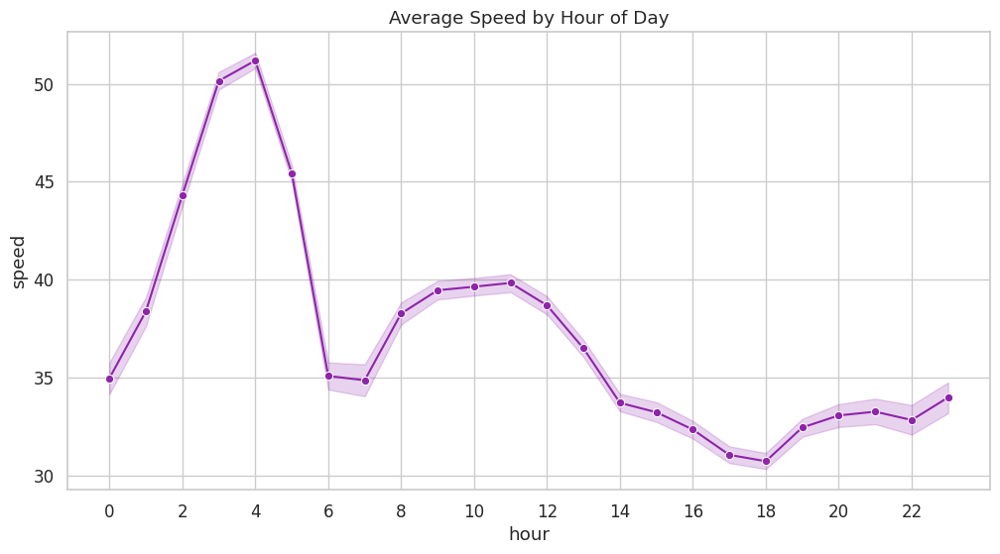

In [ ]:
# Hourly average speed
traffic['hour'] = traffic['data_as_of'].dt.hour
sns.lineplot(data=traffic, x='hour', y='speed', color='#8E24AA', marker='o')
plt.title('Average Speed by Hour of Day')
plt.xticks(range(0, 24, 2))
plt.grid(True)
plt.show()

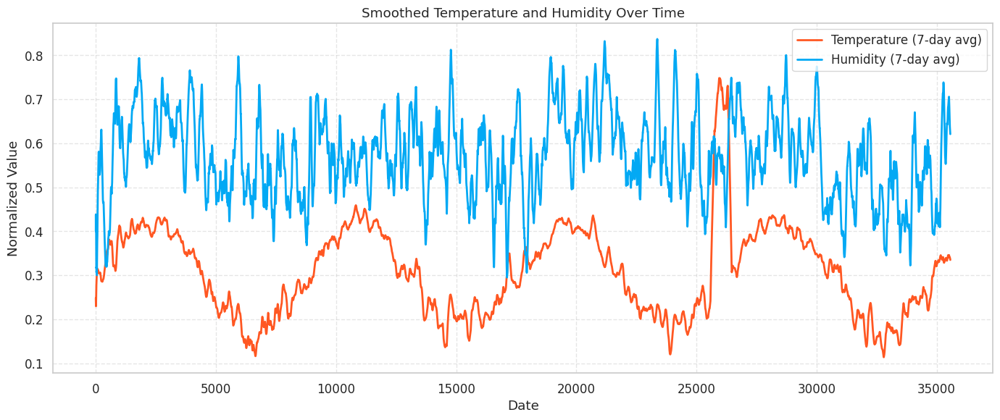

In [ ]:
# Load and process
weather = pd.read_csv("weather.csv", parse_dates=['datetime'])

# Apply rolling average for smoother trends
weather_smooth = weather[['temp', 'humidity']].rolling(window=24*7, min_periods=1).mean()

# Plot
plt.figure(figsize=(14, 6))
plt.plot(weather_smooth.index, weather_smooth['temp'], color='#FF5722', linewidth=2, label='Temperature (7-day avg)')
plt.plot(weather_smooth.index, weather_smooth['humidity'], color='#03A9F4', linewidth=2, label='Humidity (7-day avg)')

plt.title('Smoothed Temperature and Humidity Over Time')
plt.xlabel('Date')
plt.ylabel('Normalized Value')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


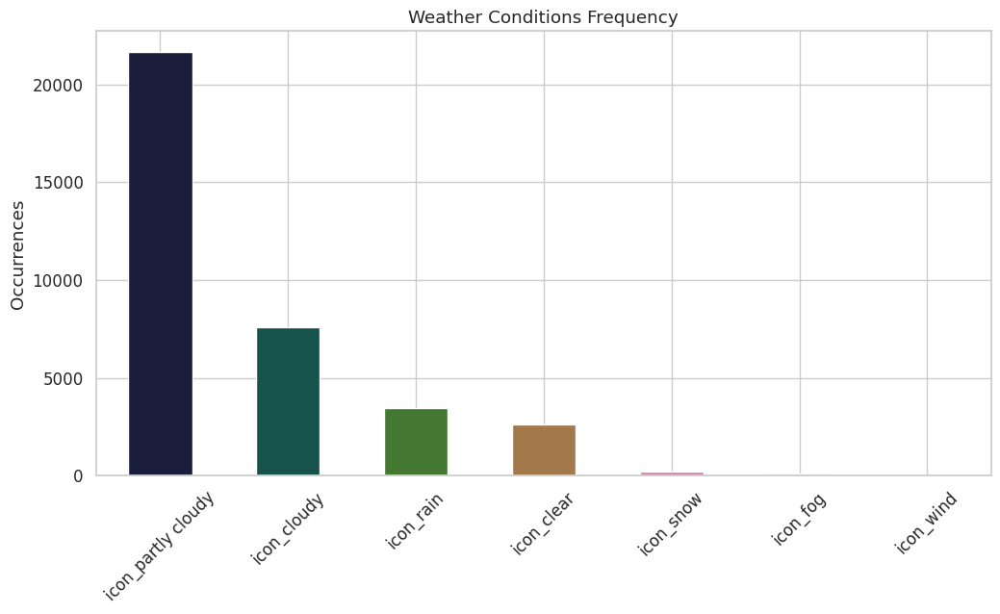

In [ ]:
# Weather condition frequency
icon_cols = [col for col in weather.columns if col.startswith('icon_')]
icon_counts = weather[icon_cols].sum().sort_values(ascending=False)
icon_counts.plot(kind='bar', color=sns.color_palette("cubehelix", len(icon_counts)))
plt.title('Weather Conditions Frequency')
plt.ylabel("Occurrences")
plt.xticks(rotation=45)
plt.show()

In [ ]:
print(traffic.shape)
print(collisions.shape)
print(weather.shape)

(31526, 19)
(71386, 16)
(35568, 24)


In [ ]:
traffic

,speed,travel_time,data_as_of,link_points,borough,link_name,hour_sin,hour_cos,minute_sin,minute_cos,day_sin,day_cos,week_num_sin,week_num_cos,month_sin,month_cos,is_holiday,is_non_business_day,hour
0,53.02,70.83,2021-05-23 00:00:00,"40.6665206,-73.76246 40.66738,-73.77021 40.667...",Queens,Belt Pkwy W 182nd St - JFK Expressway,0.000000,1.000000,0.0,1.0,-0.781831,0.623490,0.696551,-0.717507,0.5,-0.866025,0,1,0
1,56.75,66.00,2021-05-23 01:00:00,"40.6665206,-73.76246 40.66738,-73.77021 40.667...",Queens,Belt Pkwy W 182nd St - JFK Expressway,0.258819,0.965926,0.0,1.0,-0.781831,0.623490,0.696551,-0.717507,0.5,-0.866025,0,1,1
2,58.22,64.29,2021-05-23 02:00:00,"40.6665206,-73.76246 40.66738,-73.77021 40.667...",Queens,Belt Pkwy W 182nd St - JFK Expressway,0.500000,0.866025,0.0,1.0,-0.781831,0.623490,0.696551,-0.717507,0.5,-0.866025,0,1,2
3,58.48,64.12,2021-05-23 03:00:00,"40.6665206,-73.76246 40.66738,-73.77021 40.667...",Queens,Belt Pkwy W 182nd St - JFK Expressway,0.707107,0.707107,0.0,1.0,-0.781831,0.623490,0.696551,-0.717507,0.5,-0.866025,0,1,3
4,60.27,62.20,2021-05-23 04:00:00,"40.6665206,-73.76246 40.66738,-73.77021 40.667...",Queens,Belt Pkwy W 182nd St - JFK Expressway,0.866025,0.500000,0.0,1.0,-0.781831,0.623490,0.696551,-0.717507,0.5,-0.866025,0,1,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31521,40.90,91.83,2025-05-21 23:00:00,"40.6665206,-73.76246 40.66738,-73.77021 40.667...",Queens,Belt Pkwy W 182nd St - JFK Expressway,-0.258819,0.965926,0.0,1.0,0.974928,-0.222521,0.606800,-0.794854,0.5,-0.866025,0,0,23
31522,41.52,90.83,2025-05-22 00:00:00,"40.6665206,-73.76246 40.66738,-73.77021 40.667...",Queens,Belt Pkwy W 182nd St - JFK Expressway,0.000000,1.000000,0.0,1.0,0.433884,-0.900969,0.606800,-0.794854,0.5,-0.866025,0,0,0
31523,46.86,80.17,2025-05-22 01:00:00,"40.6665206,-73.76246 40.66738,-73.77021 40.667...",Queens,Belt Pkwy W 182nd St - JFK Expressway,0.258819,0.965926,0.0,1.0,0.433884,-0.900969,0.606800,-0.794854,0.5,-0.866025,0,0,1
31524,39.97,99.83,2025-05-22 02:00:00,"40.6665206,-73.76246 40.66738,-73.77021 40.667...",Queens,Belt Pkwy W 182nd St - JFK Expressway,0.500000,0.866025,0.0,1.0,0.433884,-0.900969,0.606800,-0.794854,0.5,-0.866025,0,0,2


In [ ]:
collisions

,CRASH DATE,CRASH TIME,BOROUGH,ZIP CODE,LATITUDE,LONGITUDE,LOCATION,ON STREET NAME,CROSS STREET NAME,OFF STREET NAME,NUMBER OF PERSONS INJURED,NUMBER OF PERSONS KILLED,CONTRIBUTING FACTOR VEHICLE 1,COLLISION_ID,VEHICLE TYPE CODE 1,crash_month
0,2024-01-01,6:00,QUEENS,11416.0,40.685920,-73.846924,"(40.68592, -73.846924)",97 AVENUE,WOODHAVEN BOULEVARD,Unspecified,0,0,Unspecified,4691952,Sedan,2024-01
1,2024-01-01,5:57,QUEENS,11434.0,40.672382,-73.785740,"(40.672382, -73.78574)",BAISLEY BOULEVARD,ROCKAWAY BOULEVARD,Unspecified,1,0,Unsafe Speed,4691606,E-Scooter,2024-01
2,2024-01-01,15:38,QUEENS,11378.0,40.732250,-73.924520,"(40.73225, -73.92452)",54 AVENUE,43 STREET,Unspecified,0,0,Failure to Yield Right-of-Way,4692223,Station Wagon/Sport Utility Vehicle,2024-01
3,2024-01-01,6:10,QUEENS,11434.0,40.678970,-73.759850,"(40.67897, -73.75985)",MERRICK BOULEVARD,BELKNAP STREET,Unspecified,0,0,Unsafe Speed,4691645,Sedan,2024-01
4,2024-01-01,10:15,QUEENS,11417.0,40.679283,-73.832630,"(40.679283, -73.83263)",109 AVENUE,107 STREET,Unspecified,1,0,Traffic Control Disregarded,4691840,Sedan,2024-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71381,2024-12-31,9:00,QUEENS,11372.0,40.755950,-73.881645,"(40.75595, -73.881645)",86 ST,NORTHERN BLVD,Unspecified,1,0,Driver Inattention/Distraction,4784109,Sedan,2024-12
71382,2024-12-31,6:26,QUEENS,11693.0,40.587605,-73.811714,"(40.587605, -73.811714)",Unspecified,Unspecified,86-10 ROCKAWAY BEACH BLVD,1,0,Glare,4784543,Sedan,2024-12
71383,2024-12-31,2:20,QUEENS,11412.0,40.692620,-73.747870,"(40.69262, -73.74787)",119 AVE,203 ST,Unspecified,0,0,Driver Inattention/Distraction,4783179,Sedan,2024-12
71384,2024-12-31,15:30,QUEENS,11105.0,40.779747,-73.915820,"(40.779747, -73.91582)",23 ST,DITMARS BLVD,Unspecified,0,0,Unspecified,4783681,Station Wagon/Sport Utility Vehicle,2024-12


In [ ]:
weather

,datetime,temp,feelslike,dew,humidity,precip,snow,snowdepth,windgust,windspeed,...,solarenergy,uvindex,hour,icon_clear,icon_cloudy,icon_fog,icon_partly cloudy,icon_rain,icon_snow,icon_wind
0,2021-05-01 00:00:00,0.248198,0.287283,0.286536,0.437402,0.000000,0.0,0.0,0.694411,0.655822,...,0.0,0.0,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,2021-05-01 01:00:00,0.238929,0.276304,0.262371,0.390509,0.000000,0.0,0.0,0.799049,0.645548,...,0.0,0.0,1,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,2021-05-01 02:00:00,0.232750,0.269899,0.255466,0.386022,0.000000,0.0,0.0,0.753864,0.631849,...,0.0,0.0,2,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,2021-05-01 03:00:00,0.231720,0.268984,0.254315,0.385798,0.000000,0.0,0.0,0.726516,0.626712,...,0.0,0.0,3,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,2021-05-01 04:00:00,0.223481,0.260750,0.262371,0.442114,0.000000,0.0,0.0,0.664685,0.606164,...,0.0,0.0,4,0.0,0.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35563,2025-05-21 19:00:00,0.269825,0.345837,0.370541,0.697779,0.000000,0.0,0.0,0.508918,0.426370,...,0.0,0.0,19,0.0,1.0,0.0,0.0,0.0,0.0,0.0
35564,2025-05-21 20:00:00,0.261586,0.338518,0.373993,0.759367,0.003038,0.0,0.0,0.403092,0.327055,...,0.0,0.0,20,0.0,0.0,0.0,0.0,1.0,0.0,0.0
35565,2025-05-21 21:00:00,0.258496,0.309241,0.379747,0.810074,0.015166,0.0,0.0,0.419738,0.376712,...,0.0,0.0,21,0.0,0.0,0.0,0.0,1.0,0.0,0.0
35566,2025-05-21 22:00:00,0.255407,0.304666,0.378596,0.819610,0.003038,0.0,0.0,0.462545,0.426370,...,0.0,0.0,22,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [ ]:
merged_df = pd.merge(traffic, weather, left_on='data_as_of', right_on='datetime', how='inner')
merged_df.to_csv('merged_traffic_weather.csv', index=False)


In [ ]:
temp = pd.read_csv('merged_traffic_weather.csv')
temp

,speed,travel_time,data_as_of,link_points,borough,link_name,hour_sin,hour_cos,minute_sin,minute_cos,...,solarenergy,uvindex,hour_y,icon_clear,icon_cloudy,icon_fog,icon_partly cloudy,icon_rain,icon_snow,icon_wind
0,53.02,70.83,2021-05-23 00:00:00,"40.6665206,-73.76246 40.66738,-73.77021 40.667...",Queens,Belt Pkwy W 182nd St - JFK Expressway,0.000000,1.000000,0.0,1.0,...,0.0,0.0,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,56.75,66.00,2021-05-23 01:00:00,"40.6665206,-73.76246 40.66738,-73.77021 40.667...",Queens,Belt Pkwy W 182nd St - JFK Expressway,0.258819,0.965926,0.0,1.0,...,0.0,0.0,1,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,58.22,64.29,2021-05-23 02:00:00,"40.6665206,-73.76246 40.66738,-73.77021 40.667...",Queens,Belt Pkwy W 182nd St - JFK Expressway,0.500000,0.866025,0.0,1.0,...,0.0,0.0,2,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,58.48,64.12,2021-05-23 03:00:00,"40.6665206,-73.76246 40.66738,-73.77021 40.667...",Queens,Belt Pkwy W 182nd St - JFK Expressway,0.707107,0.707107,0.0,1.0,...,0.0,0.0,3,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,60.27,62.20,2021-05-23 04:00:00,"40.6665206,-73.76246 40.66738,-73.77021 40.667...",Queens,Belt Pkwy W 182nd St - JFK Expressway,0.866025,0.500000,0.0,1.0,...,0.0,0.0,4,0.0,0.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31521,37.28,101.17,2025-05-21 19:00:00,"40.6665206,-73.76246 40.66738,-73.77021 40.667...",Queens,Belt Pkwy W 182nd St - JFK Expressway,-0.965926,0.258819,0.0,1.0,...,0.0,0.0,19,0.0,1.0,0.0,0.0,0.0,0.0,0.0
31522,36.24,103.92,2025-05-21 20:00:00,"40.6665206,-73.76246 40.66738,-73.77021 40.667...",Queens,Belt Pkwy W 182nd St - JFK Expressway,-0.866025,0.500000,0.0,1.0,...,0.0,0.0,20,0.0,0.0,0.0,0.0,1.0,0.0,0.0
31523,36.50,103.00,2025-05-21 21:00:00,"40.6665206,-73.76246 40.66738,-73.77021 40.667...",Queens,Belt Pkwy W 182nd St - JFK Expressway,-0.707107,0.707107,0.0,1.0,...,0.0,0.0,21,0.0,0.0,0.0,0.0,1.0,0.0,0.0
31524,38.42,98.17,2025-05-21 22:00:00,"40.6665206,-73.76246 40.66738,-73.77021 40.667...",Queens,Belt Pkwy W 182nd St - JFK Expressway,-0.500000,0.866025,0.0,1.0,...,0.0,0.0,22,0.0,0.0,0.0,0.0,1.0,0.0,0.0


## Nearby ZIP Codes for Belt Pkwy W 182nd St - JFK Expressway

- **11430** – Covers JFK Airport and the immediate vicinity.  
- **11413** – Covers Springfield Gardens, which includes parts of 182nd Street.  
- **11434** – Covers parts of South Jamaica, just north of JFK.  
- **11420** – Covers parts of South Ozone Park, northwest of JFK.  
- **11436** – Covers South Ozone Park near the southern end of the Van Wyck Expressway.

| ZIP Code | Neighborhood               | Land Area (sq mi) |
|----------|----------------------------|-------------------|
| 11430    | JFK Airport                | 7.1               |
| 11413    | Springfield Gardens        | 3.016             |
| 11434    | Jamaica                    | 3.2               |
| 11420    | South Ozone Park           | 2.108             |
| 11436    | Jamaica / South Ozone Park | 0.798             |
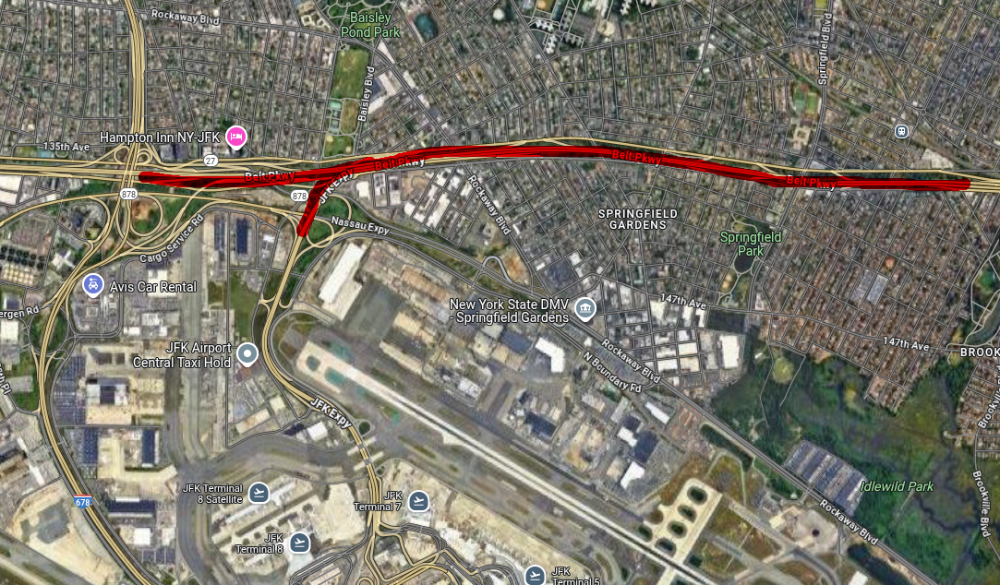

In [ ]:
merged_df = pd.read_csv('merged_traffic_weather.csv', parse_dates=['data_as_of'])

# Convert and clean collision datetime
collisions['CRASH DATE'] = pd.to_datetime(collisions['CRASH DATE'], errors='coerce')
collision = collisions.dropna(subset=['CRASH DATE'])

# Filter by ZIP CODE
target_zip_codes = [11430, 11413, 11434, 11420, 11436]
collision = collision[collision['ZIP CODE'].isin(target_zip_codes)]

# Round CRASH DATE to nearest hour
collision['CRASH DATE'] = collision['CRASH DATE'].dt.round('h')

# Sort both dataframes
collision = collision.sort_values('CRASH DATE')
merged_df = merged_df.sort_values('data_as_of')

# Merge with left join
merged_final = pd.merge_asof(
    merged_df,
    collision,
    left_on='data_as_of',
    right_on='CRASH DATE',
    direction='nearest',
    tolerance=pd.Timedelta('1h')
)

# Fill collision columns with -1 if no match
collision_cols = [col for col in collision.columns if col != 'CRASH DATE']
merged_final[collision_cols] = merged_final[collision_cols].fillna(-1)

# Save the result
merged_final.to_csv('final_merged.csv', index=False)


In [ ]:
cleaned = pd.read_csv('final_merged.csv')
cleaned

,speed,travel_time,data_as_of,link_points,borough,link_name,hour_sin,hour_cos,minute_sin,minute_cos,...,LOCATION,ON STREET NAME,CROSS STREET NAME,OFF STREET NAME,NUMBER OF PERSONS INJURED,NUMBER OF PERSONS KILLED,CONTRIBUTING FACTOR VEHICLE 1,COLLISION_ID,VEHICLE TYPE CODE 1,crash_month
0,53.02,70.83,2021-05-23 00:00:00,"40.6665206,-73.76246 40.66738,-73.77021 40.667...",Queens,Belt Pkwy W 182nd St - JFK Expressway,0.000000,1.000000,0.0,1.0,...,"(40.6707, -73.77366)",140 AVENUE,BREWER BOULEVARD,Unspecified,2.0,0.0,Driver Inattention/Distraction,4419439.0,Station Wagon/Sport Utility Vehicle,2021-05
1,56.75,66.00,2021-05-23 01:00:00,"40.6665206,-73.76246 40.66738,-73.77021 40.667...",Queens,Belt Pkwy W 182nd St - JFK Expressway,0.258819,0.965926,0.0,1.0,...,"(40.6707, -73.77366)",140 AVENUE,BREWER BOULEVARD,Unspecified,2.0,0.0,Driver Inattention/Distraction,4419439.0,Station Wagon/Sport Utility Vehicle,2021-05
2,58.22,64.29,2021-05-23 02:00:00,"40.6665206,-73.76246 40.66738,-73.77021 40.667...",Queens,Belt Pkwy W 182nd St - JFK Expressway,0.500000,0.866025,0.0,1.0,...,-1,-1,-1,-1,-1.0,-1.0,-1,-1.0,-1,-1
3,58.48,64.12,2021-05-23 03:00:00,"40.6665206,-73.76246 40.66738,-73.77021 40.667...",Queens,Belt Pkwy W 182nd St - JFK Expressway,0.707107,0.707107,0.0,1.0,...,-1,-1,-1,-1,-1.0,-1.0,-1,-1.0,-1,-1
4,60.27,62.20,2021-05-23 04:00:00,"40.6665206,-73.76246 40.66738,-73.77021 40.667...",Queens,Belt Pkwy W 182nd St - JFK Expressway,0.866025,0.500000,0.0,1.0,...,-1,-1,-1,-1,-1.0,-1.0,-1,-1.0,-1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31521,37.28,101.17,2025-05-21 19:00:00,"40.6665206,-73.76246 40.66738,-73.77021 40.667...",Queens,Belt Pkwy W 182nd St - JFK Expressway,-0.965926,0.258819,0.0,1.0,...,-1,-1,-1,-1,-1.0,-1.0,-1,-1.0,-1,-1
31522,36.24,103.92,2025-05-21 20:00:00,"40.6665206,-73.76246 40.66738,-73.77021 40.667...",Queens,Belt Pkwy W 182nd St - JFK Expressway,-0.866025,0.500000,0.0,1.0,...,-1,-1,-1,-1,-1.0,-1.0,-1,-1.0,-1,-1
31523,36.50,103.00,2025-05-21 21:00:00,"40.6665206,-73.76246 40.66738,-73.77021 40.667...",Queens,Belt Pkwy W 182nd St - JFK Expressway,-0.707107,0.707107,0.0,1.0,...,-1,-1,-1,-1,-1.0,-1.0,-1,-1.0,-1,-1
31524,38.42,98.17,2025-05-21 22:00:00,"40.6665206,-73.76246 40.66738,-73.77021 40.667...",Queens,Belt Pkwy W 182nd St - JFK Expressway,-0.500000,0.866025,0.0,1.0,...,-1,-1,-1,-1,-1.0,-1.0,-1,-1.0,-1,-1


In [ ]:
columns_to_drop = ['borough', 'link_name', 'VEHICLE TYPE CODE 1', 'COLLISION_ID',
                   'LATITUDE', 'LONGITUDE', 'LOCATION', 'ZIP CODE','CRASH DATE']

cleaned = cleaned.drop(columns=[col for col in columns_to_drop if col in cleaned.columns])


In [ ]:
cleaned['CONTRIBUTING FACTOR VEHICLE 1'].nunique()

40

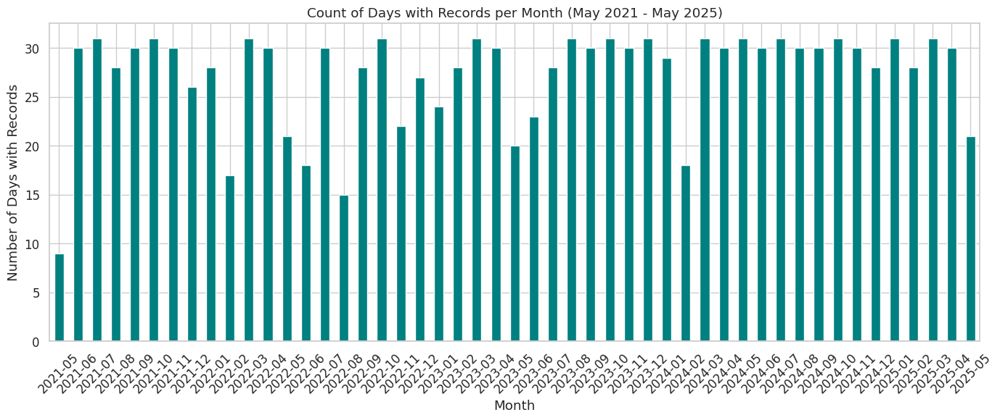

In [ ]:
cleaned['data_as_of'] = pd.to_datetime(cleaned['data_as_of'])

# Filter date range
start_date = '2021-05-01'
end_date = '2025-05-21'

df_filtered = cleaned.loc[
    (cleaned['data_as_of'] >= start_date) &
    (cleaned['data_as_of'] <= end_date)
].copy()

# Extract year-month
df_filtered.loc[:, 'year_month'] = df_filtered['data_as_of'].dt.to_period('M')

# Extract date only
df_filtered.loc[:, 'date_only'] = df_filtered['data_as_of'].dt.date

# Group by year_month and count unique dates per month
days_per_month = df_filtered.groupby('year_month')['date_only'].nunique()

# Create full month range for continuity
all_months = pd.period_range(start=start_date, end=end_date, freq='M')
days_per_month = days_per_month.reindex(all_months, fill_value=0)

# Plot
plt.figure(figsize=(14,6))
days_per_month.plot(kind='bar', color='teal')

plt.title('Count of Days with Records per Month (May 2021 - May 2025)')
plt.xlabel('Month')
plt.ylabel('Number of Days with Records')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


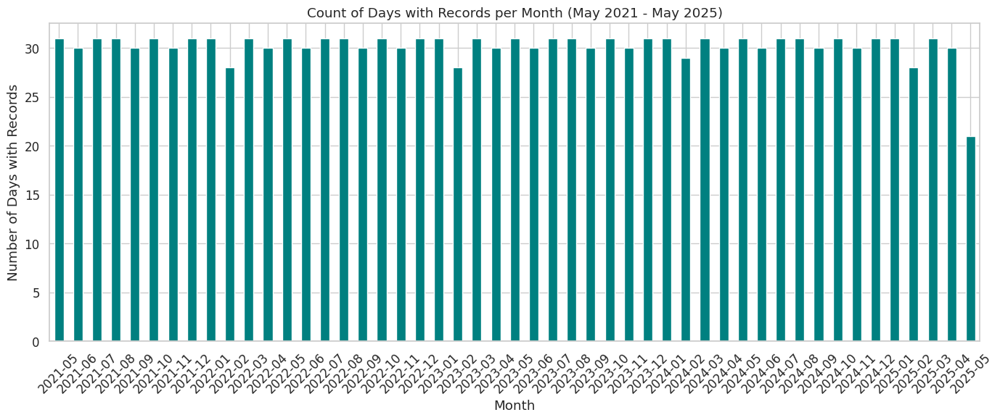

In [ ]:
weather['datetime'] = pd.to_datetime(weather['datetime'])

# Filter date range
start_date = '2021-05-01'
end_date = '2025-05-21'

df_filtered = weather.loc[
    (weather['datetime'] >= start_date) &
    (weather['datetime'] <= end_date)
].copy()

# Extract year-month
df_filtered.loc[:, 'year_month'] = df_filtered['datetime'].dt.to_period('M')

# Extract date only
df_filtered.loc[:, 'date_only'] = df_filtered['datetime'].dt.date

# Group by year_month and count unique dates per month
days_per_month = df_filtered.groupby('year_month')['date_only'].nunique()

# Create full month range for continuity
all_months = pd.period_range(start=start_date, end=end_date, freq='M')
days_per_month = days_per_month.reindex(all_months, fill_value=0)

# Plot
plt.figure(figsize=(14,6))
days_per_month.plot(kind='bar', color='teal')

plt.title('Count of Days with Records per Month (May 2021 - May 2025)')
plt.xlabel('Month')
plt.ylabel('Number of Days with Records')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


#Creating Lag Features

In [ ]:
cleaned = cleaned.sort_values('data_as_of')

for lag in [1, 2, 3, 24, 168]:
    cleaned[f'speed_lag_{lag}h'] = cleaned['speed'].shift(lag)
    cleaned[f'travel_time_lag_{lag}h'] = cleaned['travel_time'].shift(lag)

#Creating Rolling Window Features

In [ ]:
for window in [3, 6, 12]:
    cleaned[f'speed_rolling_mean_{window}h'] = cleaned['speed'].rolling(window=window).mean()
    cleaned[f'travel_time_rolling_mean_{window}h'] = cleaned['travel_time'].rolling(window=window).mean()

    cleaned[f'speed_rolling_std_{window}h'] = cleaned['speed'].rolling(window=window).std()
    cleaned[f'travel_time_rolling_std_{window}h'] = cleaned['travel_time'].rolling(window=window).std()

#Creating Speed Changes and Their Percentages


In [ ]:
cleaned['speed_change_1h'] = cleaned['speed'] - cleaned['speed_lag_1h']
cleaned['speed_change_3h'] = cleaned['speed'] - cleaned['speed_lag_3h']
cleaned['speed_change_24h'] = cleaned['speed'] - cleaned['speed_lag_24h']

cleaned['speed_pct_change_1h'] = (cleaned['speed'] / cleaned['speed_lag_1h'] - 1) * 100
cleaned['speed_pct_change_24h'] = (cleaned['speed'] / cleaned['speed_lag_24h'] - 1) * 100

#Creating Week-Over-Week Differentials

In [ ]:
cleaned['speed_vs_last_week'] = cleaned['speed'] - cleaned['speed_lag_168h']
cleaned['travel_time_vs_last_week'] = cleaned['travel_time'] - cleaned['travel_time_lag_168h']

In [ ]:
cleaned.columns

Index(['speed', 'travel_time', 'data_as_of', 'link_points', 'hour_sin',
       'hour_cos', 'minute_sin', 'minute_cos', 'day_sin', 'day_cos',
       'week_num_sin', 'week_num_cos', 'month_sin', 'month_cos', 'is_holiday',
       'is_non_business_day', 'hour_x', 'datetime', 'temp', 'feelslike', 'dew',
       'humidity', 'precip', 'snow', 'snowdepth', 'windgust', 'windspeed',
       'winddir', 'cloudcover', 'visibility', 'solarradiation', 'solarenergy',
       'uvindex', 'hour_y', 'icon_clear', 'icon_cloudy', 'icon_fog',
       'icon_partly cloudy', 'icon_rain', 'icon_snow', 'icon_wind',
       'CRASH TIME', 'BOROUGH', 'ON STREET NAME', 'CROSS STREET NAME',
       'OFF STREET NAME', 'NUMBER OF PERSONS INJURED',
       'NUMBER OF PERSONS KILLED', 'CONTRIBUTING FACTOR VEHICLE 1',
       'crash_month', 'speed_lag_1h', 'travel_time_lag_1h', 'speed_lag_2h',
       'travel_time_lag_2h', 'speed_lag_3h', 'travel_time_lag_3h',
       'speed_lag_24h', 'travel_time_lag_24h', 'speed_lag_168h',
       

In [ ]:
zero_na = traffic.isnull().sum()
print(zero_na[zero_na == 0].to_string())


speed                  0
travel_time            0
data_as_of             0
link_points            0
borough                0
link_name              0
hour_sin               0
hour_cos               0
minute_sin             0
minute_cos             0
day_sin                0
day_cos                0
week_num_sin           0
week_num_cos           0
month_sin              0
month_cos              0
is_holiday             0
is_non_business_day    0
hour                   0


#Dropping The First Week To Handle All NULLs

In [ ]:
first_complete_index = 168
complete_data = cleaned.iloc[first_complete_index:].copy()

print(f"Original data shape: {cleaned.shape}")
print(f"Complete data shape: {complete_data.shape}")

remaining_nulls = complete_data.isna().sum().sum()
print(f"Remaining null values: {remaining_nulls}")


Original data shape: (31526, 79)
Complete data shape: (31358, 79)
Remaining null values: 4288


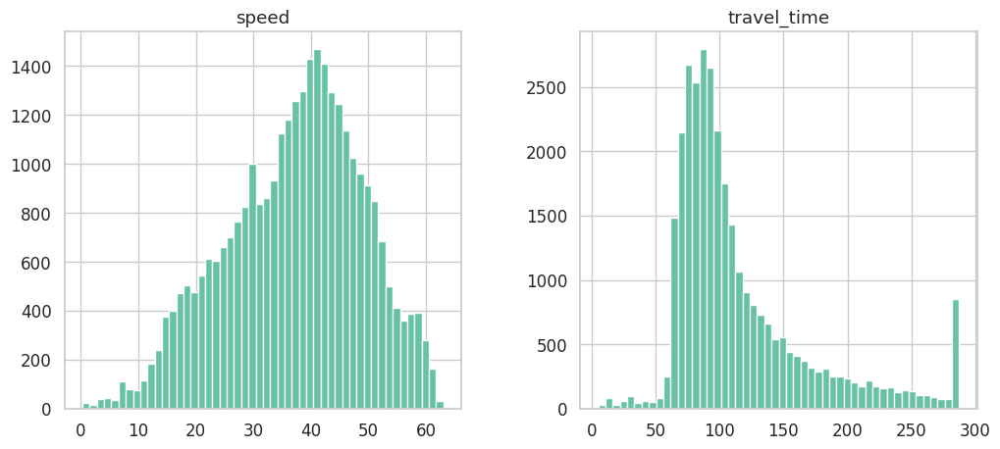

In [ ]:
complete_data[['speed', 'travel_time']].hist(bins=50, figsize=(12, 5))
plt.show()

##Handling speed and travel_time data

<ipython-input-41-e9c82f3922aa>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  complete_data['speed'] = complete_data['speed'].clip(lower=speed_lower, upper=speed_upper)


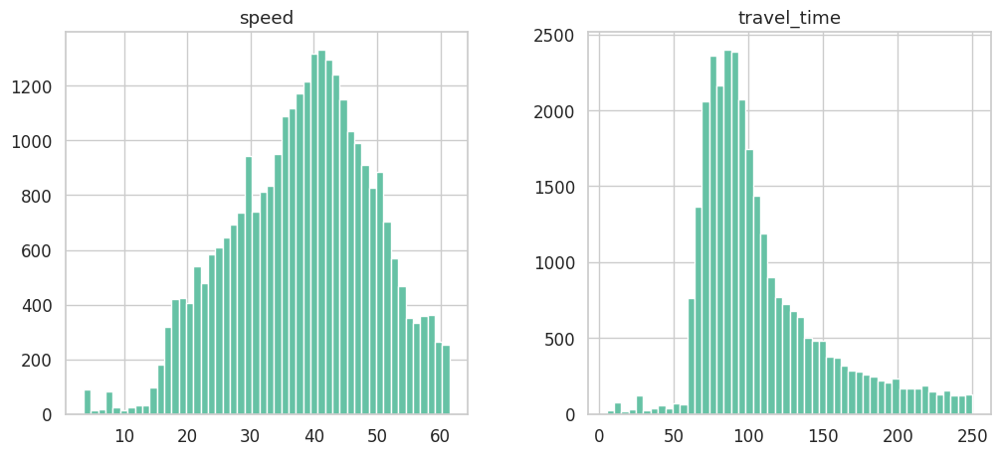

In [ ]:
speed_lower = complete_data['speed'].quantile(0.002)
speed_upper = complete_data['speed'].quantile(0.998)
complete_data = complete_data[complete_data['travel_time'] <= 250]
# Clip gently
complete_data['speed'] = complete_data['speed'].clip(lower=speed_lower, upper=speed_upper)
complete_data[['speed', 'travel_time']].hist(bins=50, figsize=(12, 5))
plt.show()

In [ ]:
na_columns = complete_data.columns[complete_data.isnull().sum() != 0].tolist()
print(na_columns)


['windgust']


In [ ]:
for col in na_columns:
    print(col)


windgust


In [ ]:
complete_data.dropna(subset=['windgust'], inplace=True)

In [ ]:
complete_data.shape

(25898, 121)

In [ ]:
complete_data.head(5)

,speed,travel_time,data_as_of,link_points,hour_sin,hour_cos,minute_sin,minute_cos,day_sin,day_cos,...,factor_Pedestrian/Bicyclist/Other Pedestrian Error/Confusion,factor_Reaction to Uninvolved Vehicle,factor_Steering Failure,factor_Traffic Control Disregarded,factor_Turning Improperly,factor_Unsafe Lane Changing,factor_Unsafe Speed,factor_Unspecified,factor_View Obstructed/Limited,factor_nan
0,55.87,67.17,2021-05-30 00:00:00,"40.6665206,-73.76246 40.66738,-73.77021 40.667...",0.000000,1.000000,0.0,1.0,-0.781831,0.62349,...,False,False,False,False,False,False,False,False,False,False
1,56.85,65.92,2021-05-30 01:00:00,"40.6665206,-73.76246 40.66738,-73.77021 40.667...",0.258819,0.965926,0.0,1.0,-0.781831,0.62349,...,False,False,False,False,False,False,False,False,False,False
2,58.20,64.50,2021-05-30 02:00:00,"40.6665206,-73.76246 40.66738,-73.77021 40.667...",0.500000,0.866025,0.0,1.0,-0.781831,0.62349,...,False,False,False,False,False,False,False,False,False,False
3,60.27,62.12,2021-05-30 03:00:00,"40.6665206,-73.76246 40.66738,-73.77021 40.667...",0.707107,0.707107,0.0,1.0,-0.781831,0.62349,...,False,False,False,False,False,False,False,False,False,False
4,59.34,63.17,2021-05-30 04:00:00,"40.6665206,-73.76246 40.66738,-73.77021 40.667...",0.866025,0.500000,0.0,1.0,-0.781831,0.62349,...,False,False,False,False,False,False,False,False,False,False


##Feature engineering for collisions data analysis

In [ ]:
# Total Injuries and Fatalities
complete_data['total_injuries'] = complete_data['NUMBER OF PERSONS INJURED']
complete_data['total_fatalities'] = complete_data['NUMBER OF PERSONS KILLED']

# Numerical Crash Severity
# 0 = No Injury, 1 = Injury Only, 2 = Fatal
def numerical_severity(injuries, fatalities):
    if fatalities > 0:
        return 2
    elif injuries > 0:
        return 1
    else:
        return 0

complete_data['crash_severity'] = complete_data.apply(
    lambda row: numerical_severity(row['NUMBER OF PERSONS INJURED'], row['NUMBER OF PERSONS KILLED']),
    axis=1
)

# Crash Occurred (binary)
complete_data['crash_occurred'] = (
    (complete_data['NUMBER OF PERSONS INJURED'] > 0) |
    (complete_data['NUMBER OF PERSONS KILLED'] > 0) |
    (
        complete_data['CONTRIBUTING FACTOR VEHICLE 1'].notna() &
        (complete_data['CONTRIBUTING FACTOR VEHICLE 1'].str.upper() != 'UNSPECIFIED')
    )
).astype(int)


In [ ]:
# Fill missing values
complete_data['CONTRIBUTING FACTOR VEHICLE 1'] = complete_data['CONTRIBUTING FACTOR VEHICLE 1'].fillna('Unknown')

# Label Encoding
le = LabelEncoder()
complete_data['contributing_factor_encoded'] = le.fit_transform(complete_data['CONTRIBUTING FACTOR VEHICLE 1'])

# One-Hot Encoding
contributing_factor_dummies = pd.get_dummies(
    complete_data['CONTRIBUTING FACTOR VEHICLE 1'],
    prefix='factor',
    dummy_na=True
)

# Concatenate one-hot encoded columns to original data
complete_data = pd.concat([complete_data, contributing_factor_dummies], axis=1)


In [ ]:
# Example: drop 3 columns
columns_to_drop = ['icon_clear', 'icon_cloudy', 'icon_fog', 'icon_partly cloudy', 'icon_rain', 'icon_snow','icon_wind', 'CRASH TIME', 'BOROUGH', 'ON STREET NAME', 'CROSS STREET NAME', 'OFF STREET NAME', 'NUMBER OF PERSONS INJURED', 'NUMBER OF PERSONS KILLED', 'CONTRIBUTING FACTOR VEHICLE 1']
complete_data = complete_data.drop(columns=columns_to_drop)


In [ ]:
# Print columns 10 per line
cols = complete_data.columns.tolist()
for i in range(0, len(cols), 10):
    print(cols[i:i+10])


['speed', 'travel_time', 'data_as_of', 'link_points', 'hour_sin', 'hour_cos', 'minute_sin', 'minute_cos', 'day_sin', 'day_cos']
['week_num_sin', 'week_num_cos', 'month_sin', 'month_cos', 'is_holiday', 'is_non_business_day', 'hour_x', 'datetime', 'temp', 'feelslike']
['dew', 'humidity', 'precip', 'snow', 'snowdepth', 'windgust', 'windspeed', 'winddir', 'cloudcover', 'visibility']
['solarradiation', 'solarenergy', 'uvindex', 'hour_y', 'crash_month', 'speed_lag_1h', 'travel_time_lag_1h', 'speed_lag_2h', 'travel_time_lag_2h', 'speed_lag_3h']
['travel_time_lag_3h', 'speed_lag_24h', 'travel_time_lag_24h', 'speed_lag_168h', 'travel_time_lag_168h', 'speed_rolling_mean_3h', 'travel_time_rolling_mean_3h', 'speed_rolling_std_3h', 'travel_time_rolling_std_3h', 'speed_rolling_mean_6h']
['travel_time_rolling_mean_6h', 'speed_rolling_std_6h', 'travel_time_rolling_std_6h', 'speed_rolling_mean_12h', 'travel_time_rolling_mean_12h', 'speed_rolling_std_12h', 'travel_time_rolling_std_12h', 'speed_change_1h

In [ ]:
complete_data.to_csv('Data.csv', index = False)

In [ ]:
complete_data = pd.read_csv('Data.csv')

#Models and Training

##Import Libraries

In [ ]:
from catboost import CatBoostRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, explained_variance_score
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import time
import warnings
import warnings
warnings.filterwarnings("ignore")

##Setup Features

In [ ]:
targets = ['speed', 'travel_time']
features = [
    'hour_sin', 'hour_cos', 'minute_sin', 'minute_cos',
    'day_sin', 'day_cos', 'week_num_sin', 'week_num_cos',
    'month_sin', 'month_cos', 'is_holiday', 'is_non_business_day',
    'hour_x', 'temp', 'feelslike', 'dew', 'humidity', 'precip',
    'snow', 'snowdepth', 'windgust', 'windspeed', 'winddir',
    'cloudcover', 'visibility', 'solarradiation', 'solarenergy',
    'uvindex', 'hour_y', 'speed_lag_1h', 'travel_time_lag_1h',
    'speed_lag_2h', 'travel_time_lag_2h', 'speed_lag_3h',
    'travel_time_lag_3h', 'speed_lag_24h', 'travel_time_lag_24h',
    'speed_lag_168h', 'travel_time_lag_168h', 'speed_rolling_mean_3h',
    'travel_time_rolling_mean_3h', 'speed_rolling_std_3h',
    'travel_time_rolling_std_3h', 'speed_rolling_mean_6h',
    'travel_time_rolling_mean_6h', 'speed_rolling_std_6h',
    'travel_time_rolling_std_6h', 'speed_rolling_mean_12h',
    'travel_time_rolling_mean_12h', 'speed_rolling_std_12h',
    'travel_time_rolling_std_12h', 'speed_change_1h',
    'speed_change_3h', 'speed_change_24h', 'speed_pct_change_1h',
    'speed_pct_change_24h', 'speed_vs_last_week',
    'travel_time_vs_last_week', 'total_injuries', 'total_fatalities',
    'crash_severity', 'crash_occurred'
]

lag_features = [col for col in features if 'lag' in col or 'rolling' in col or 'change' in col or 'vs_last_week' in col]
non_lag_features = [col for col in features if col not in lag_features]
def prepare_data(df):
    df = df.dropna().copy()

    # Ensure datetime
    df['data_as_of'] = pd.to_datetime(df['data_as_of'])
    df = df.sort_values('data_as_of')

    X = df[features]
    y = df[targets]

    # Time-based split
    total_len = len(df)
    train_end = int(0.7 * total_len)
    val_end = int(0.85 * total_len)

    X_train = X.iloc[:train_end]
    y_train = y.iloc[:train_end]

    X_val = X.iloc[train_end:val_end]
    y_val = y.iloc[train_end:val_end]

    X_test = X.iloc[val_end:]
    y_test = y.iloc[val_end:]

    return X_train, X_val, X_test, y_train, y_val, y_test, features


def sanitize_features(X):
    for col in X.columns:
        if X[col].dtype == 'object':
            try:
                X[col] = pd.to_numeric(X[col])
            except ValueError:
                X[col] = X[col].astype('category')
    return X

def select_features(df, use_lag):
    return df[features if use_lag else non_lag_features]

##Evaluate models and overfitting Check

In [ ]:
def evaluate_model(model, X_train, X_val, y_train, y_val, model_name, target_name, use_lag=True):
    start_time = time.time()
    X_train = sanitize_features(X_train.copy())
    X_val = sanitize_features(X_val.copy())
    eval_results = {}
    train_loss, val_loss = [], []

    if model_name == 'CatBoost':
        model.fit(X_train, y_train, eval_set=(X_val, y_val), verbose=False)
        eval_results = model.get_evals_result()

    elif model_name == 'XGBoost':
        model.fit(X_train, y_train,
                  eval_set=[(X_train, y_train), (X_val, y_val)],
                  verbose=False)
        eval_results = model.evals_result_

    elif model_name == 'LightGBM':
        model.set_params(verbose=-1)
        model.fit(X_train, y_train,
                  eval_set=[(X_train, y_train), (X_val, y_val)],
                  eval_metric="rmse")
        eval_results = model.evals_result_

    elif model_name == 'NeuralNetwork':
        X_train_sub, X_val_sub, y_train_sub, y_val_sub = train_test_split(X_train, y_train, test_size=0.2)
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train_sub)
        X_val_scaled = scaler.transform(X_val_sub)
        mlp = MLPRegressor(hidden_layer_sizes=(100, 50), max_iter=1, warm_start=True)
        for _ in range(100):
            mlp.fit(X_train_scaled, y_train_sub)
            train_loss.append(mlp.loss_)
            y_val_pred = mlp.predict(X_val_scaled)
            val_loss.append(mean_squared_error(y_val_sub, y_val_pred))
        model = Pipeline([('scaler', scaler), ('mlp', mlp)])
    else:
        model.fit(X_train, y_train)

    y_pred_val = model.predict(X_val)
    response_time = time.time() - start_time

    metrics = {
        'RMSE': np.sqrt(mean_squared_error(y_val, y_pred_val)),
        'MSE': mean_squared_error(y_val, y_pred_val),
        'MAE': mean_absolute_error(y_val, y_pred_val),
        'MedianAE': np.median(np.abs(y_val - y_pred_val)),
        'R2': r2_score(y_val, y_pred_val),
        'ExplainedVariance': explained_variance_score(y_val, y_pred_val),
        'ResponseTime': response_time
    }

#Plotting
    colors = {'Train': '#1f77b4', 'Validation': '#ff7f0e', 'Actual': '#2ca02c', 'Predicted': '#d62728'}
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.plot(range(len(y_val[:100])), y_val[:100], label='Actual', color=colors['Actual'])
    plt.plot(range(len(y_pred_val[:100])), y_pred_val[:100], label='Predicted', color=colors['Predicted'])
    plt.title(f'{model_name} - {target_name} | Actual vs Predicted')
    plt.xlabel('Sample')
    plt.ylabel(target_name)
    plt.legend()

    plt.subplot(1, 2, 2)
    if model_name == 'CatBoost':
        plt.plot(eval_results['learn']['RMSE'], label='Train RMSE', color=colors['Train'])
        plt.plot(eval_results['validation']['RMSE'], label='Validation RMSE', color=colors['Validation'])
    elif model_name == 'XGBoost':
        plt.plot(eval_results['validation_0']['rmse'], label='Train RMSE', color=colors['Train'])
        plt.plot(eval_results['validation_1']['rmse'], label='Validation RMSE', color=colors['Validation'])
    elif model_name == 'LightGBM':
        plt.plot(eval_results['training']['rmse'], label='Train RMSE', color=colors['Train'])
        val_key = 'valid_1' if 'valid_1' in eval_results else 'valid_0'
        plt.plot(eval_results[val_key]['rmse'], label='Validation RMSE', color=colors['Validation'])
    elif model_name == 'NeuralNetwork':
        plt.plot(train_loss, label='Train MSE', color=colors['Train'])
        plt.plot(val_loss, label='Validation MSE', color=colors['Validation'])
    else:
        plt.text(0.5, 0.5, 'No learning curve available',
                 horizontalalignment='center', verticalalignment='center')

    plt.title(f'{model_name} - Learning Curve')
    plt.xlabel('Epoch')
    plt.ylabel('Loss / RMSE')
    plt.legend()
    plt.tight_layout()
    plt.show()

    return metrics




##Experiment train with/without (lag-rolling window) features

In [ ]:
def run_experiment(complete_data):
    X_train, X_val, X_test, y_train, y_val, y_test, _ = prepare_data(complete_data)
    results = []

    for target in targets:
        print(f"\n=== Target: {target} ===")
        for use_lag in [True, False]:
            print(f"\nUsing {'all' if use_lag else 'no lag'} features...")
            X_train_sel = select_features(X_train, use_lag).copy()
            X_val_sel = select_features(X_val, use_lag).copy()

            for name in ['CatBoost', 'XGBoost', 'LightGBM', 'RandomForest', 'NeuralNetwork']:
                print(f"Training {name}...")
                try:
                    if not use_lag:
                        if name == 'CatBoost':
                            model = CatBoostRegressor(
                                iterations=100,
                                learning_rate=0.03,
                                depth=8,
                                l2_leaf_reg=10,
                                bagging_temperature=0.2,
                                od_type='Iter',

                                random_strength=1,
                                verbose=0,
                            )
                        elif name == 'XGBoost':
                            model = XGBRegressor(
                                n_estimators=100,
                                max_depth=8,
                                learning_rate=0.05,
                                subsample=0.8,
                                colsample_bytree=0.8,
                                reg_alpha=5,
                                reg_lambda=5,
                                eval_metric='rmse',
                                early_stopping_rounds=30,
                            )
                        elif name == 'LightGBM':
                            model = LGBMRegressor(
                                n_estimators=100,
                                max_depth=8,
                                learning_rate=0.05,
                                subsample=0.8,
                                colsample_bytree=0.8,
                                reg_alpha=5,
                                reg_lambda=5,
                                metric='rmse',
                                early_stopping_round=30,
                            )
                        elif name == 'RandomForest':
                            model = RandomForestRegressor(
                                n_estimators=100,
                                max_depth=15,
                                min_samples_split=5,
                                min_samples_leaf=2,
                                max_features='sqrt',
                                bootstrap=True,
                                n_jobs=-1
                            )
                        elif name == 'NeuralNetwork':
                            model = Pipeline([
                                ('scaler', StandardScaler()),
                                ('mlp', MLPRegressor(
                                    hidden_layer_sizes=(128, 64, 32),
                                    alpha=0.002,  # L2
                                    learning_rate_init=0.001,
                                    early_stopping=True,
                                    validation_fraction=0.2,
                                    n_iter_no_change=20,
                                    max_iter=100,
                                ))
                            ])
                    else:
                        model = {
                            'CatBoost': CatBoostRegressor(
                                depth=6, iterations=200, learning_rate=0.05, verbose=0
                            ),
                            'XGBoost': XGBRegressor(
                                max_depth=6, n_estimators=200, learning_rate=0.05, eval_metric='rmse',
                                early_stopping_rounds=30
                            ),
                            'LightGBM': LGBMRegressor(
                                max_depth=6, n_estimators=200, learning_rate=0.05, metric='rmse',
                                early_stopping_round=30
                            ),
                            'RandomForest': RandomForestRegressor(
                                n_estimators=200, max_depth=12, n_jobs=-1
                            ),
                            'NeuralNetwork': Pipeline([
                                ('scaler', StandardScaler()),
                                ('mlp', MLPRegressor(
                                    hidden_layer_sizes=(100, 50),
                                    alpha=0.001,
                                    learning_rate_init=0.001,
                                    early_stopping=True,
                                    validation_fraction=0.2,
                                    n_iter_no_change=20,
                                    max_iter=50,

                                ))
                            ])
                        }[name]

                    metrics = evaluate_model(
                        model, X_train_sel, X_val_sel,
                        y_train[target], y_val[target],
                        name, target, use_lag
                    )

                    results.append({
                        'Model': name,
                        'Target': target,
                        'LagFeatures': use_lag,
                        **metrics
                    })

                    print(f"Completed - Val RMSE: {metrics['RMSE']:.4f}")

                except Exception as e:
                    print(f"Failed: {str(e)}")
                    results.append({
                        'Model': name,
                        'Target': target,
                        'LagFeatures': use_lag,
                        'Error': str(e)
                    })

    return pd.DataFrame(results)



## Run Pipelines and save results of models


=== Target: speed ===

Using all features...
Training CatBoost...


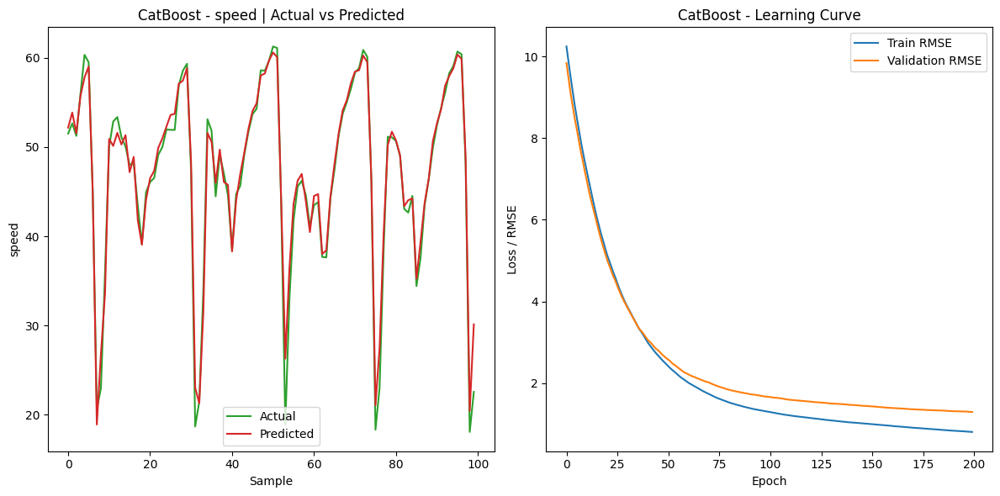

Completed - Val RMSE: 1.2894
Training XGBoost...


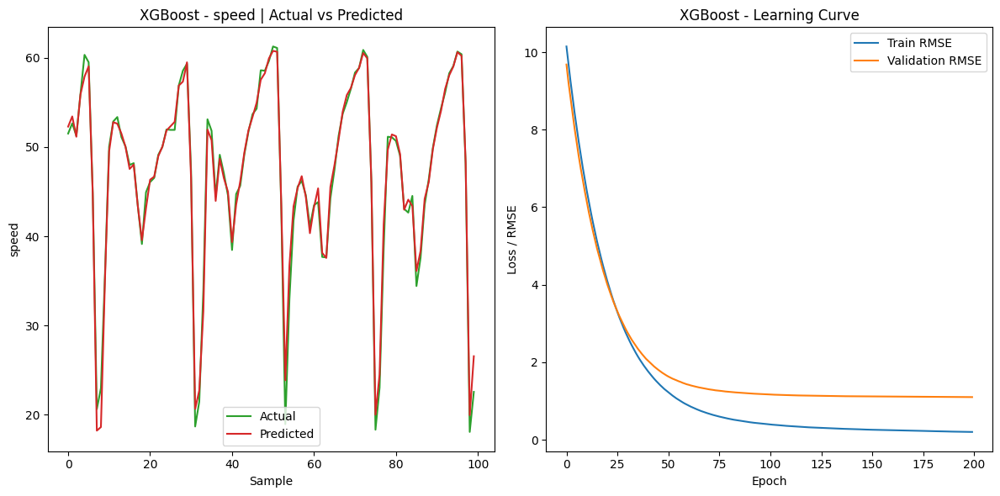

Completed - Val RMSE: 1.1028
Training LightGBM...


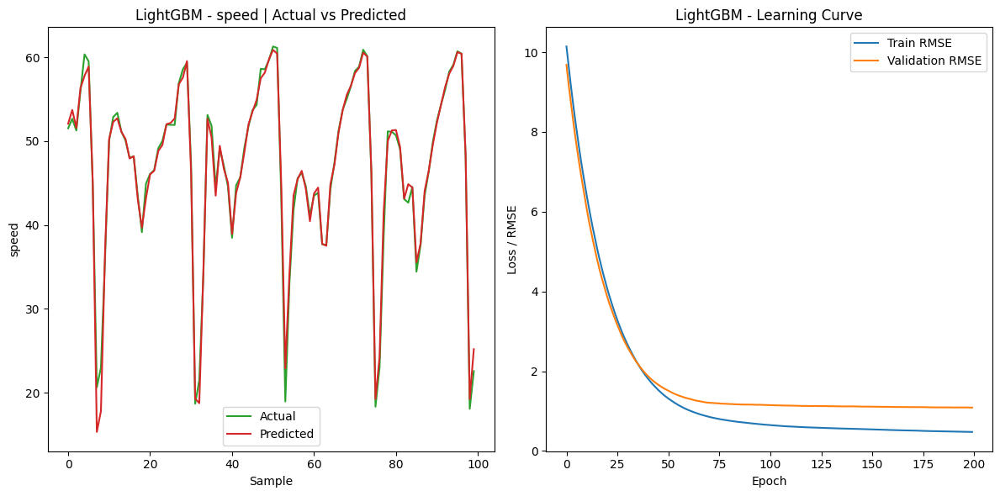

Completed - Val RMSE: 1.0867
Training RandomForest...


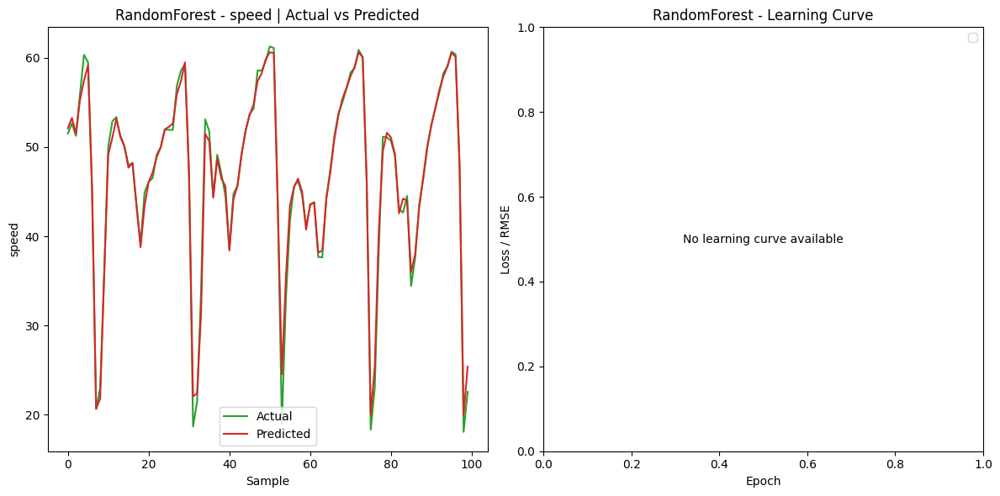

Completed - Val RMSE: 1.2172
Training NeuralNetwork...


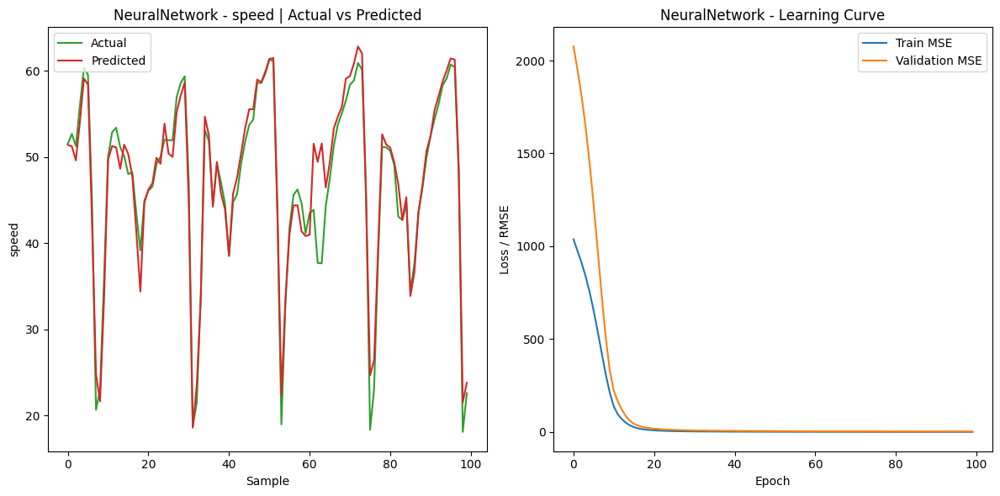

Completed - Val RMSE: 2.6167

Using no lag features...
Training CatBoost...


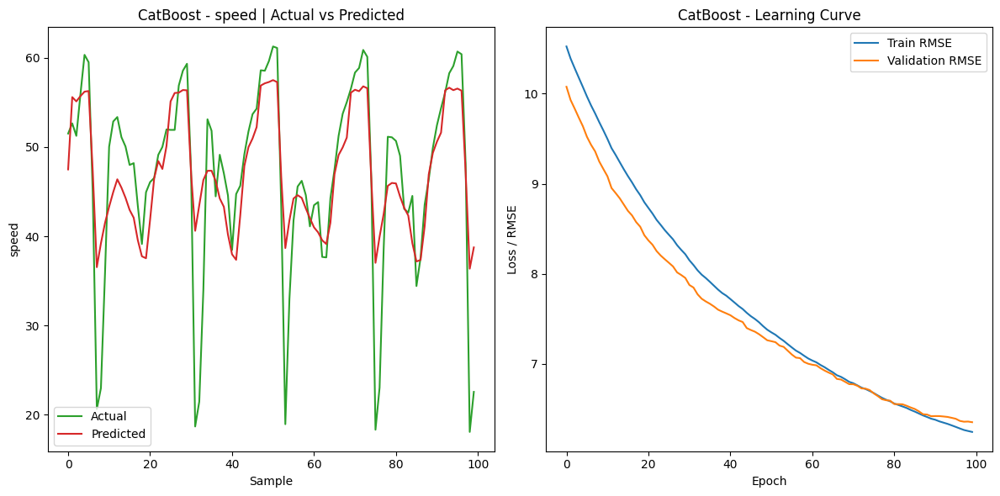

Completed - Val RMSE: 6.3532
Training XGBoost...


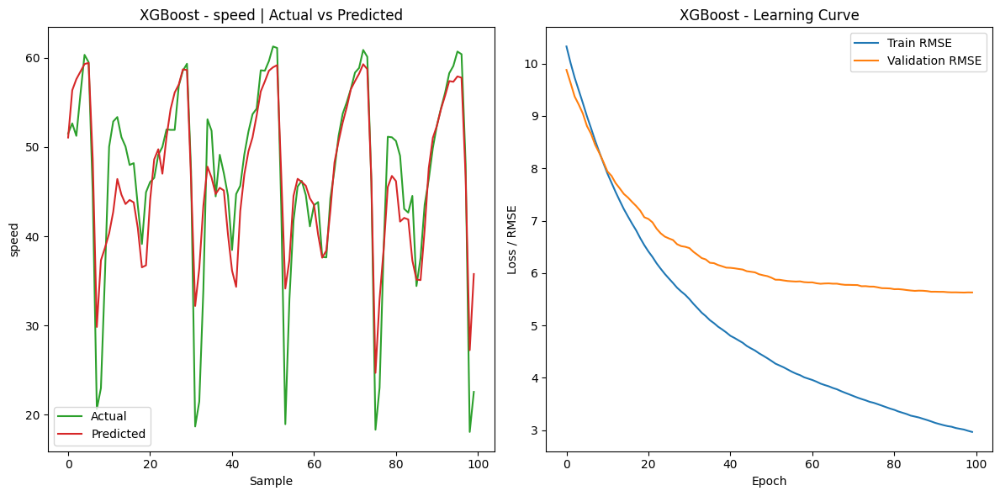

Completed - Val RMSE: 5.6280
Training LightGBM...


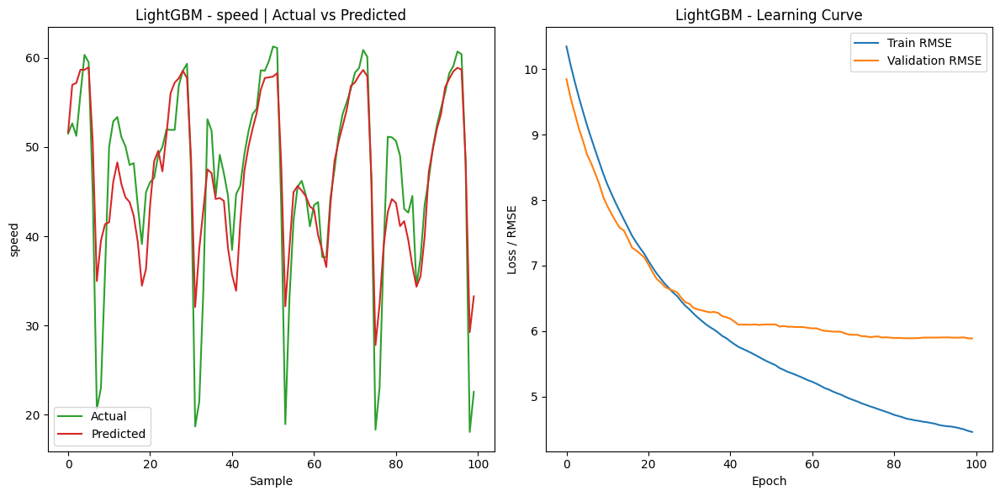

Completed - Val RMSE: 5.8898
Training RandomForest...


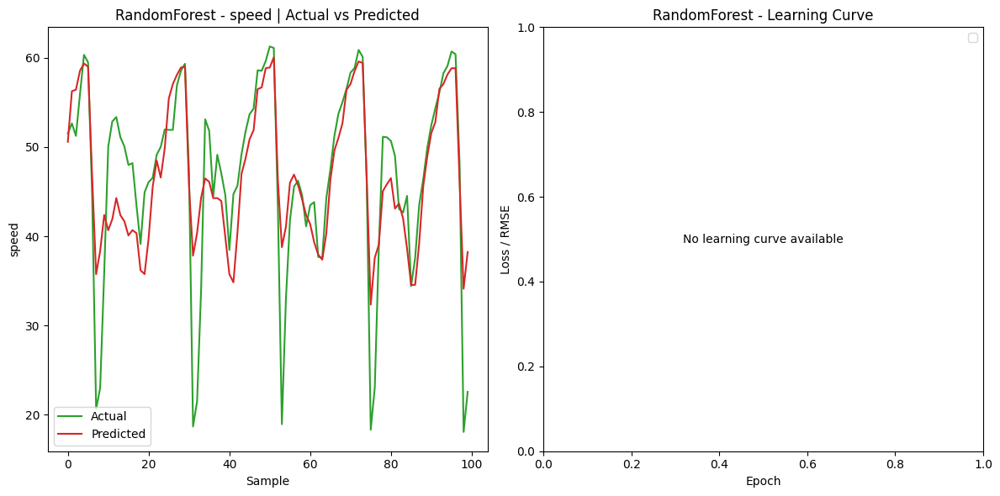

Completed - Val RMSE: 6.4990
Training NeuralNetwork...


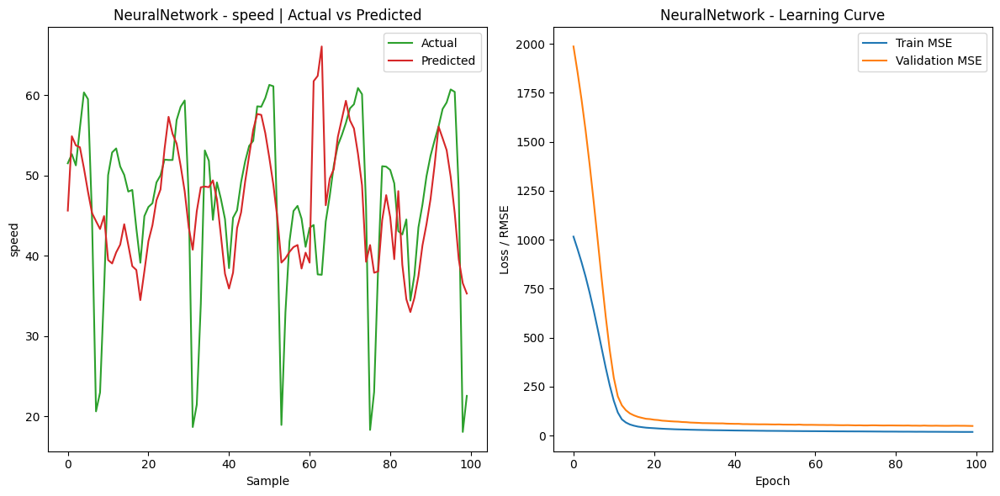

Completed - Val RMSE: 8.6695

=== Target: travel_time ===

Using all features...
Training CatBoost...


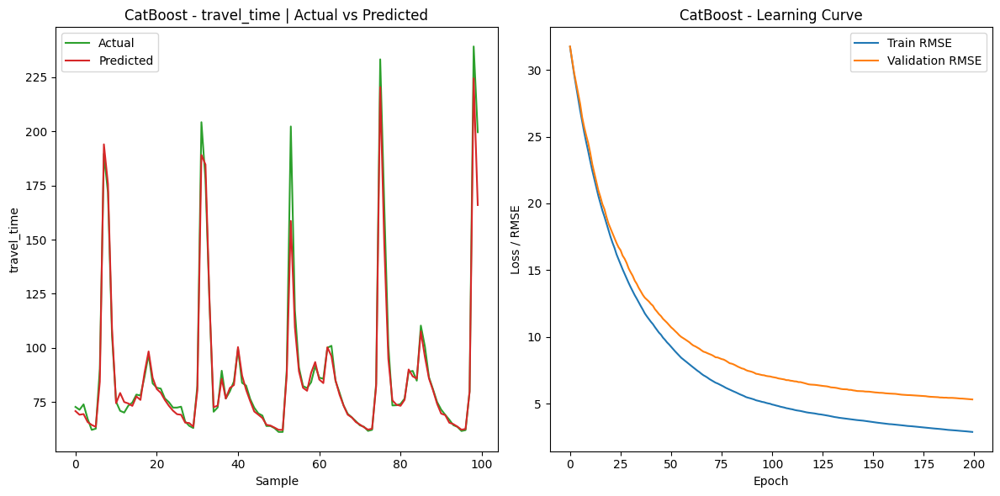

Completed - Val RMSE: 5.3205
Training XGBoost...


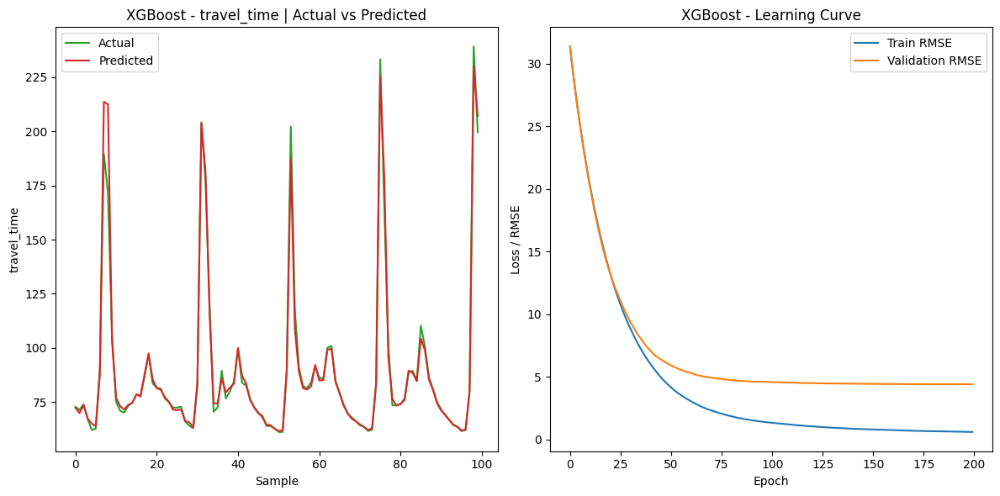

Completed - Val RMSE: 4.4200
Training LightGBM...


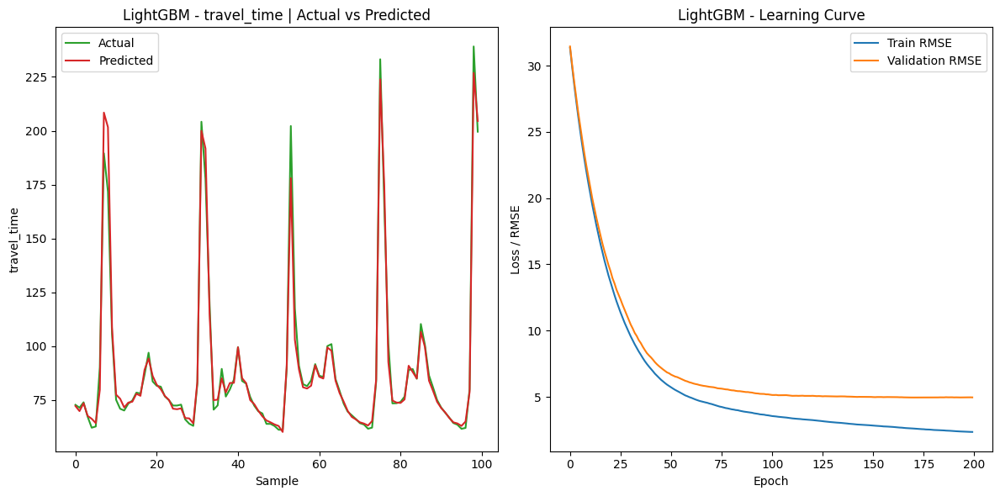

Completed - Val RMSE: 4.9508
Training RandomForest...


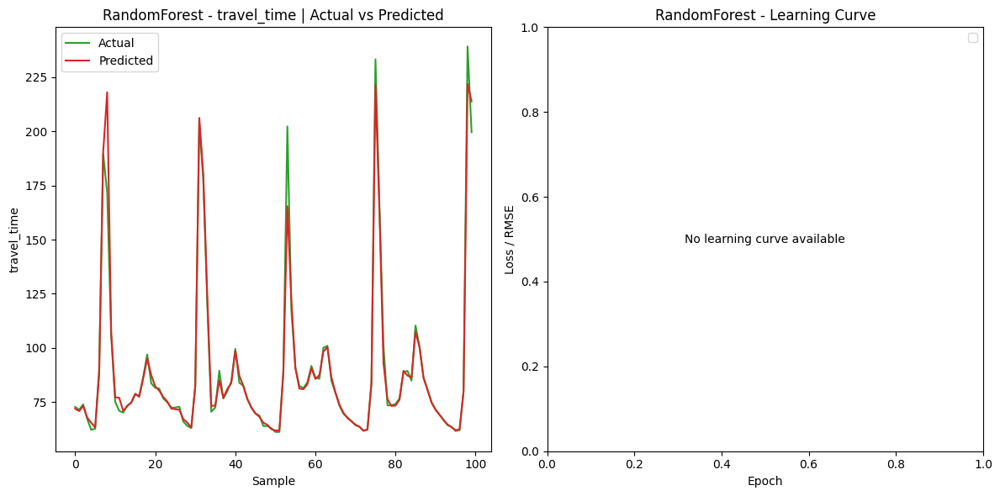

Completed - Val RMSE: 5.2484
Training NeuralNetwork...


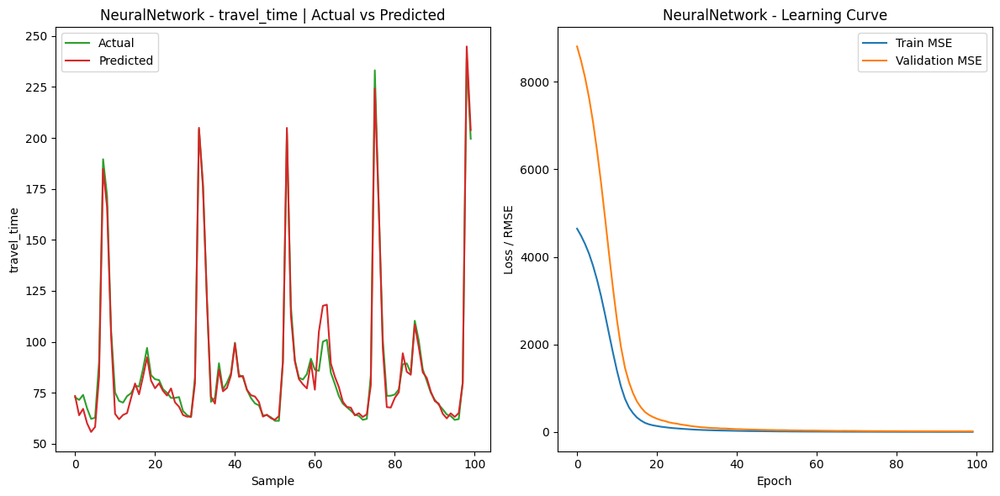

Completed - Val RMSE: 5.9631

Using no lag features...
Training CatBoost...


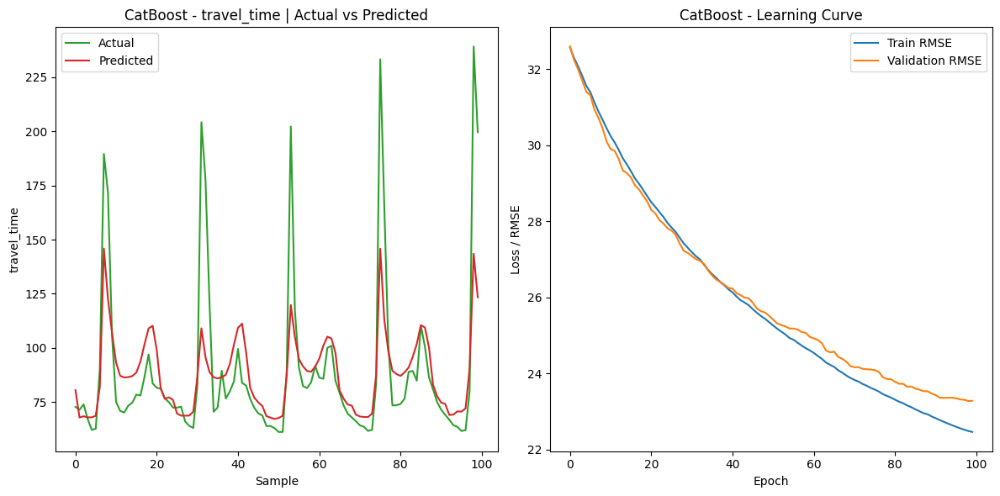

Completed - Val RMSE: 23.2754
Training XGBoost...


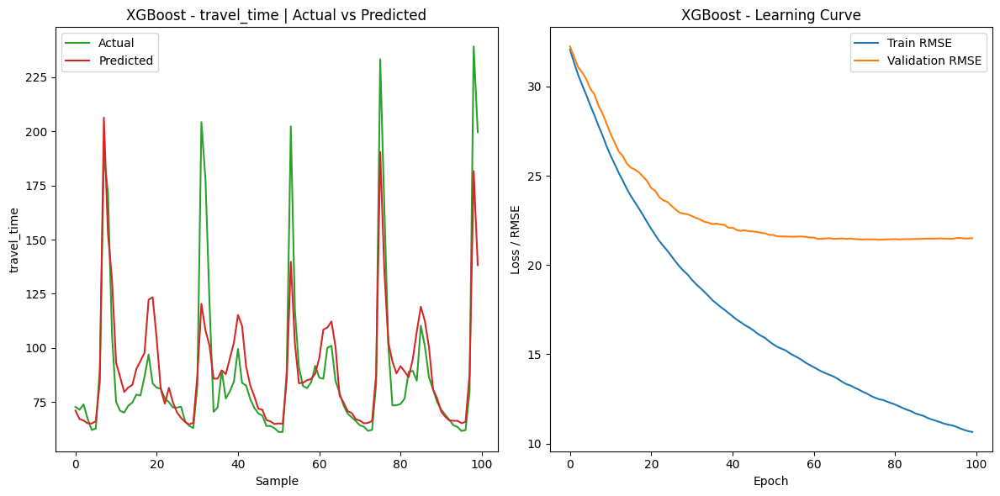

Completed - Val RMSE: 21.4147
Training LightGBM...


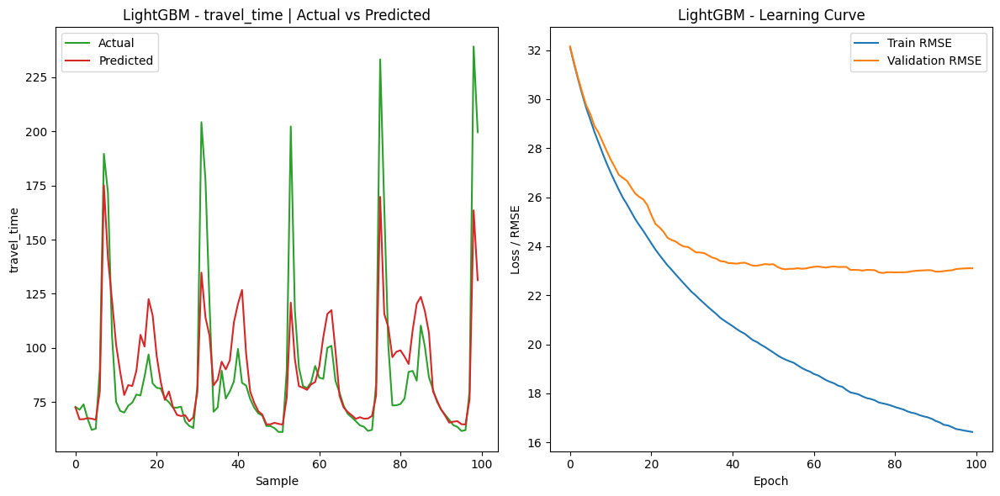

Completed - Val RMSE: 22.9119
Training RandomForest...


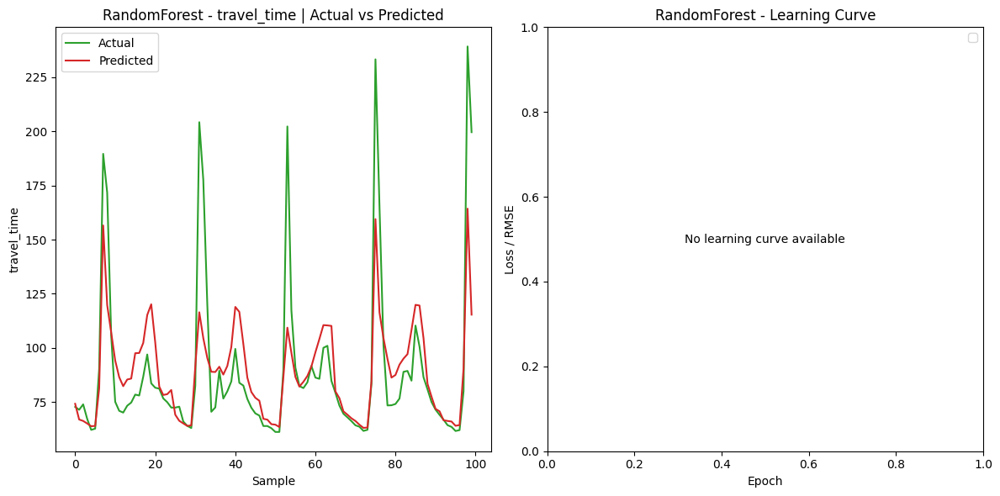

Completed - Val RMSE: 24.3594
Training NeuralNetwork...


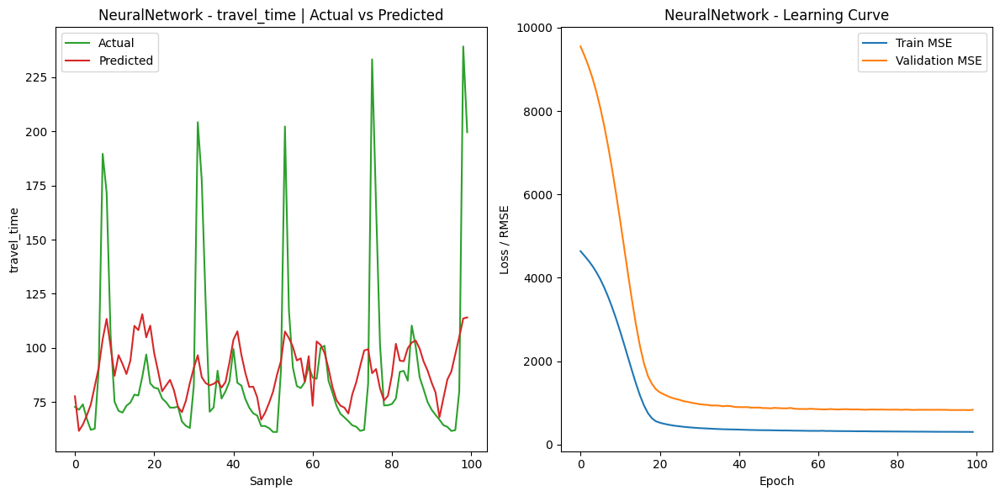

Completed - Val RMSE: 30.2154


,Model,Target,LagFeatures,RMSE,MSE,MAE,MedianAE,R2,ExplainedVariance,ResponseTime
2,LightGBM,speed,True,1.086661,1.180831,0.709618,0.446748,0.988394,0.988424,0.361926
1,XGBoost,speed,True,1.102821,1.216215,0.723555,0.432991,0.988046,0.988047,1.555542
3,RandomForest,speed,True,1.217205,1.481589,0.764571,0.383162,0.985438,0.985558,5.094531
0,CatBoost,speed,True,1.289384,1.662510,0.893041,0.629205,0.983659,0.983802,1.395660
4,NeuralNetwork,speed,True,2.616703,6.847133,1.734107,1.321518,0.932700,0.932862,2.410001
6,XGBoost,speed,False,5.628033,31.674753,4.213108,3.374954,0.688672,0.690471,0.447750
7,LightGBM,speed,False,5.889834,34.690147,4.496213,3.633588,0.659034,0.663874,0.114573
5,CatBoost,speed,False,6.353158,40.362620,4.661488,3.669483,0.603280,0.603282,0.706225
8,RandomForest,speed,False,6.499026,42.237339,4.895672,3.795539,0.584854,0.587221,0.270840
9,NeuralNetwork,speed,False,8.669490,75.160064,6.691403,5.461979,0.261260,0.284399,0.966217


In [ ]:
results_df = run_experiment(complete_data)
display(results_df.sort_values(['Target', 'RMSE']))

results_df.to_csv('model_results.csv', index=False)


##Results Summary

| Model         | Target       | Lag Features | RMSE     | MAE   | R²        | Response Time (s) |
| ------------- | ------------ | ------------ | -------- | ----- | --------- | ----------------- |
| **LightGBM**  | speed        |  Yes        | **1.09** | 0.71  | 0.988     | **0.36**          |
| **XGBoost**   | speed        |  Yes        | 1.10     | 0.72  | 0.988     | 1.56              |
| RandomForest  | speed        |  Yes        | 1.22     | 0.76  | 0.985     | 5.09              |
| CatBoost      | speed        |  Yes        | 1.29     | 0.89  | 0.984     | 1.40              |
| NeuralNetwork | speed        |  Yes        | 2.62     | 1.73  | 0.933     | 2.41              |
| **XGBoost**   | speed        |  No         | 5.63     | 4.21  | 0.689     | 0.45              |
| LightGBM      | speed        |  No         | 5.89     | 4.50  | 0.659     | **0.11**          |
| CatBoost      | speed        |  No         | 6.35     | 4.66  | 0.603     | 0.71              |
| RandomForest  | speed        |  No         | 6.50     | 4.90  | 0.585     | 0.27              |
| NeuralNetwork | speed        |  No         | 8.67     | 6.69  | 0.261     | 0.97              |
| **XGBoost**   | travel\_time |  Yes        | **4.42** | 2.10  | **0.982** | 1.60              |
| LightGBM      | travel\_time |  Yes        | 4.95     | 2.59  | 0.977     | **0.31**          |
| RandomForest  | travel\_time |  Yes        | 5.25     | 2.25  | 0.974     | 6.05              |
| CatBoost      | travel\_time |  Yes        | 5.32     | 2.81  | 0.974     | 1.42              |
| NeuralNetwork | travel\_time |  Yes        | 5.96     | 3.98  | 0.967     | 1.06              |
| **XGBoost**   | travel\_time |  No         | 21.41    | 13.59 | 0.573     | 0.48              |
| LightGBM      | travel\_time |  No         | 22.91    | 14.43 | 0.512     | **0.10**          |
| CatBoost      | travel\_time |  No         | 23.28    | 14.24 | 0.496     | 0.73              |
| RandomForest  | travel\_time |  No         | 24.36    | 15.50 | 0.448     | 0.28              |
| NeuralNetwork | travel\_time |  No         | 30.22    | 19.76 | 0.151     | 0.99              |

---

## Key Observations

*  **Lag features** significantly improve performance for both targets.
*  **LightGBM** and **XGBoost** consistently outperform other models.
*  **Neural Networks** underperform, particularly without lag features.
*  **LightGBM** offers the **best speed–accuracy tradeoff**.